# Rainfall Prediction - Weather Forecasting-Evaluation Project

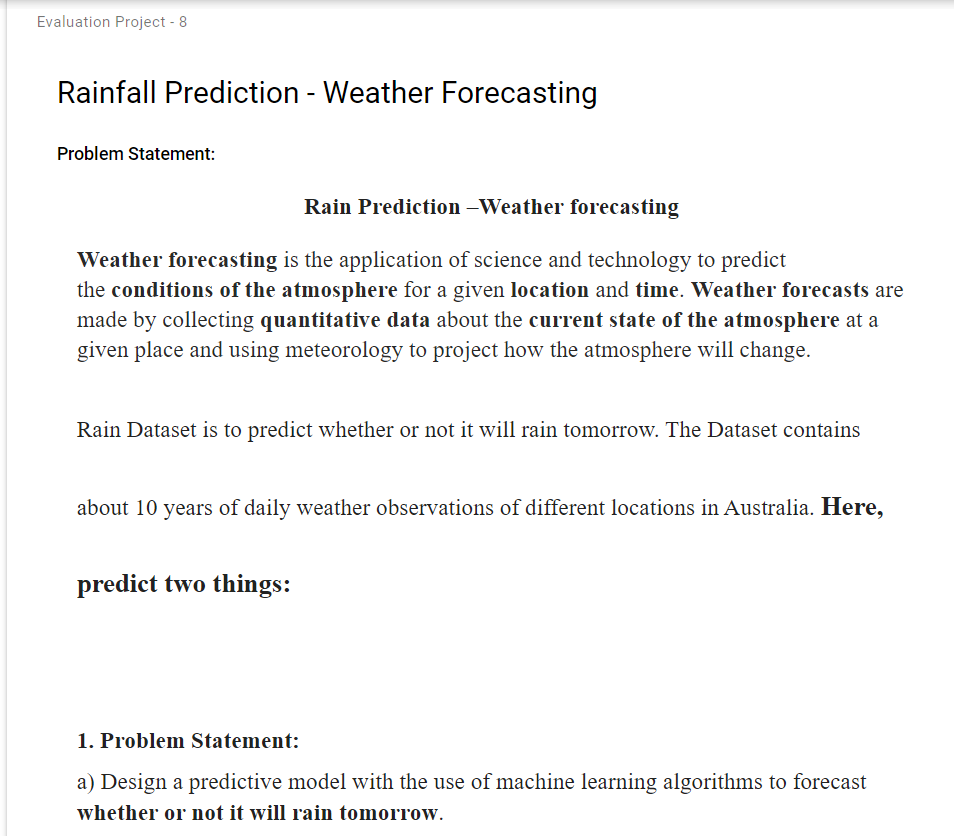

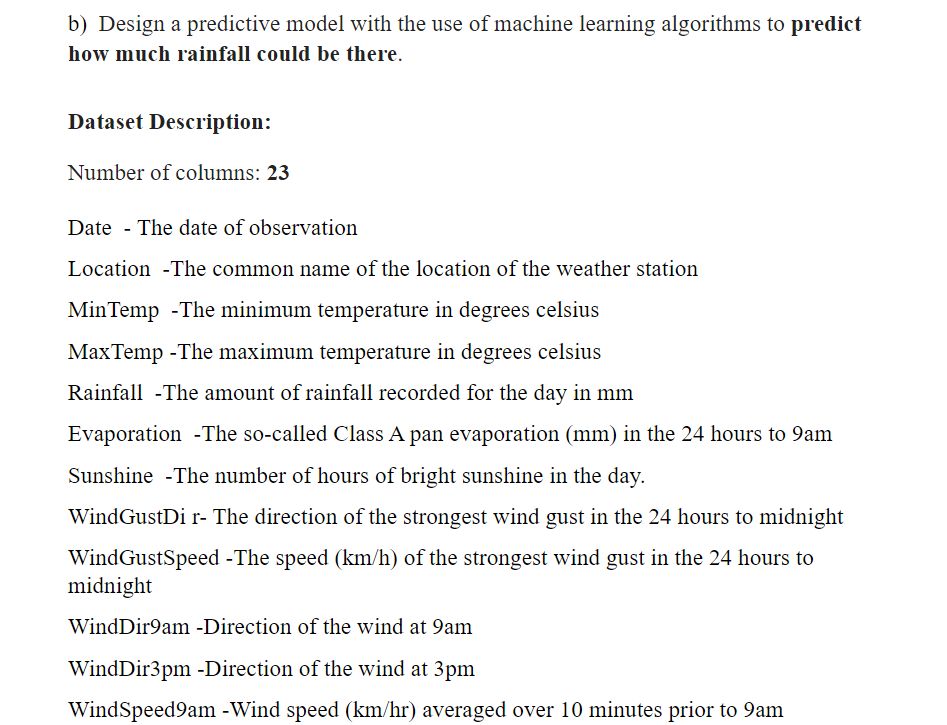

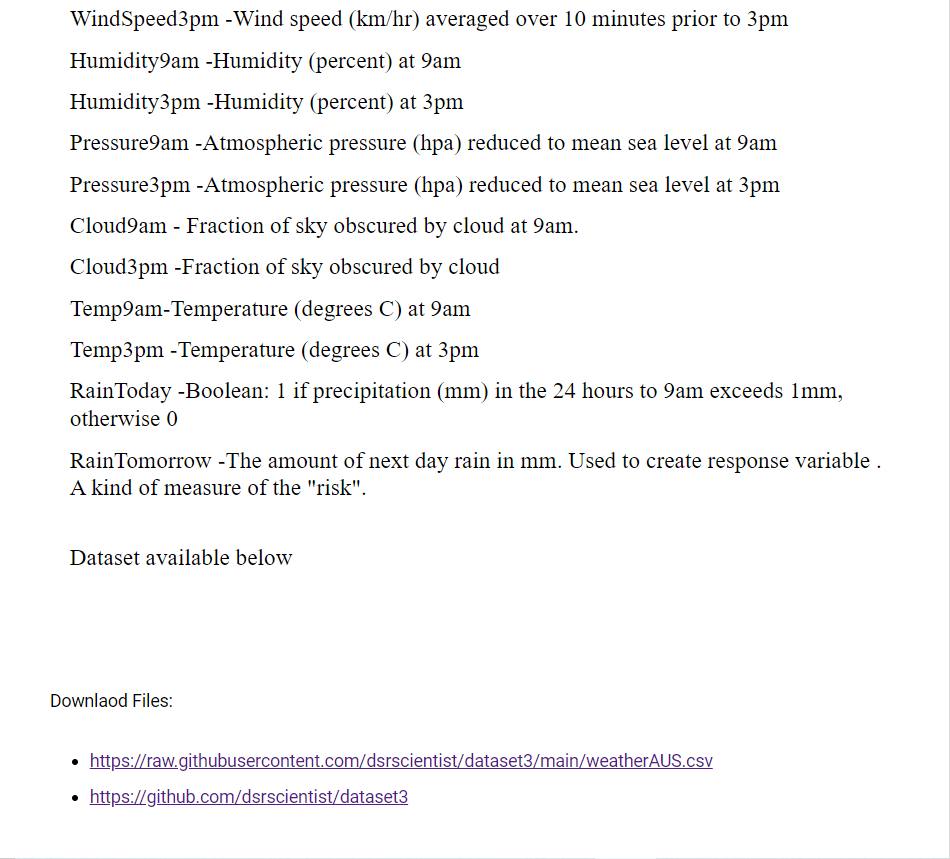

# Importing the Dataset:

In [2]:
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv("weatherAUS.csv") #reading the data file
df #diplaying the dataset with first 5 and last 5 

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [245]:
df.shape #The Total number of data (same as df)

(8425, 23)

In [14]:
df.columns #to see the columns names

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [86]:
df.head() #to see 5 first row of dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# EDA

# Checking for NULL values if any in the data frame

np.nan, None, NaN and others..

In [98]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Observations:-

- we see a significant amount of null values in the dataset, we see that evaporation and sunshine have the highest null values
- we see that the null values in cloud9am and 3pm also have a significant amount of nulls 
- pressure9am and pressure3am also have a large no of null values
- the only 2 columns which do not have nulls are date as well as location
- next step is to understand each of the columns to know how to treat them , domain knowledge is needed


In [45]:
#CAN ALSO USE

print (df.info()) #to check for null Values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

We have rechecked again and found the same null values as we saw and we will have to remove them to proceed further

# Treating the NULL values

### Understanding the columns

Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk"

In [33]:
df['Sunshine'].unique() #Checking to see what the columns are in the null columns

array([ nan,  9. ,  3.4,  6.1, 11. ,  7.1,  2.8,  6.7,  6.4,  6. ,  9.4,
        6.3, 11.1, 11.2, 11.4,  9.7,  7.9,  0.3,  0. ,  0.5,  3.5,  1.9,
        1.1,  7.8,  8.8,  1.8,  6.6,  3.1,  3. , 10.4, 10.5,  9.9,  9.5,
        1. ,  4.3,  9.2,  9.8,  4.8,  8.9,  4.5,  2.6, 10. , 10.2,  9.1,
        2.2,  0.4,  0.7,  0.2,  2.7,  8.5,  3.6,  2.5,  6.9,  8.2,  6.8,
        7.2,  9.6,  5.1,  5.8,  1.6,  0.6,  7.7,  8.3,  2.9,  8.4,  4.2,
        9.3,  4.7,  4.1,  5.3,  7.4,  7.3,  2.4, 10.6, 10.3, 10.1,  2.3,
       10.7,  8.6,  5.2, 10.9, 10.8,  8. ,  1.5,  8.7, 11.3, 11.5,  5.7,
       11.9,  3.3, 12.1, 12.4,  7. ,  4. , 11.7, 12.7, 12.5, 12.6, 13. ,
        5.5, 12.2, 11.6, 12.9, 13.1,  5.4,  3.7, 12. ,  2. ,  8.1, 13.2,
       13.6, 12.3, 11.8,  7.5,  6.2,  1.2,  3.8,  1.4,  5. ,  0.8,  4.4,
        6.5,  0.1,  4.9,  3.9,  4.6,  0.9,  5.9,  7.6,  1.3, 12.8, 13.4,
        1.7, 13.3,  3.2,  2.1, 13.5, 13.8, 13.9, 13.7,  5.6])

In [35]:
df['Evaporation'].unique() #Checking to see what the columns are in the null columns

array([  nan,   8.6,   3.8,   2.8,   3.2,   6.8,   4.2,   1.6,   4.4,
         4. ,   2.2,   3.4,   6.4,   4.6,   3.6,   4.8,   3. ,   1.2,
         1.4,   2.6,   1. ,   2. ,   8.4,   2.4,   0.6,   5.4,   1.8,
         7. ,   0.8,   0.2,   5.2,   5. ,   6. ,   7.6,   5.8,   5.6,
         8. ,   6.2,   6.6,   7.8,   8.8,   7.4,   9.4,   7.2,   0.4,
         0. ,  18. ,  24.2,  14.6,  19.4,  10.8,  28. ,  11.8,  24.6,
        11.2,  22.6,  10. ,  37. ,  26. ,  11. ,  19.8,  24.4,  10.6,
        27.4,  12. ,  11.6,  24. ,   9. ,  23. ,  29.2,  20.6,  13.2,
        22.8,   9.8,  16. ,  20. ,  10.4,   9.6,  12.2,  15.4,  18.4,
        24.8,  20.8,  32. ,  55.4,  17.8,  16.2,  14.2,  59.2,  33.8,
        10.2, 145. ,  16.6,  47. ,  15.2,  15.8,  12.6,  11.4,   9.2,
        14.8,  13. ,   8.2,  13.6,  12.8,  12.4,  17.6,  19.2,  13.8,
        22.4,  18.6,  13.4,  17. ,  14. ,  14.4,  15. ,  15.6,   0.7])

In [22]:
df['Cloud9am'].unique() #Checking to see what the columns are in the null columns

array([ 8., nan,  7.,  1.,  0.,  5.,  4.,  2.,  6.,  3.])

In [23]:
df['Cloud3pm'].unique() #Checking to see what the columns are in the null columns

array([nan,  2.,  8.,  7.,  1.,  5.,  4.,  6.,  3.,  0.])

In [24]:
df['Pressure9am'].unique() #Checking to see what the columns are in the null columns

array([1007.7, 1010.6, 1007.6, 1017.6, 1010.8, 1009.2, 1009.6, 1013.4,
       1008.9, 1007. , 1011.8, 1010.5,  994.3, 1001.2, 1009.7, 1012.2,
       1005.8, 1009.4, 1019.2, 1019.3, 1013.6, 1007.8, 1011. , 1012.9,
       1010.9, 1006.8, 1005.2, 1004.8, 1005.6, 1006.1, 1004.5, 1014.4,
       1018.7, 1015.1, 1012.6, 1011.9, 1017.8, 1009.9, 1014.1, 1015.7,
       1011.6, 1008.4, 1019.7, 1015.8, 1010.1, 1005.3, 1007.9, 1005.4,
       1016.5, 1017.7, 1014.9, 1014.6, 1014.2, 1012.5, 1011.7, 1008.8,
       1005.9, 1008. , 1008.2, 1009.3, 1012.8, 1017. , 1023.3, 1022.5,
       1016.2, 1017.2, 1012.4, 1015.6, 1013. , 1014. , 1016.6, 1007.5,
       1014.7, 1014.5, 1013.7, 1015.2, 1019.5, 1021.3, 1017.4, 1012.7,
       1013.3, 1016.3, 1014.8, 1019.1, 1023. , 1023.8, 1022.4, 1023.2,
       1022.6, 1018.8, 1019.8, 1020.4, 1021.8, 1026.7, 1027.1, 1024.2,
       1021.5, 1024.4, 1024.1, 1018.5, 1022.8, 1022.7, 1023.6, 1025.2,
       1026. , 1004. , 1013.8, 1018. , 1023.1, 1023.4, 1026.9, 1028.7,
      

In [26]:
df['Pressure3pm'].unique() #Checking to see what the columns are in the null columns

array([1007.1, 1007.8, 1008.7, 1012.8, 1006. , 1005.4, 1008.2, 1010.1,
       1003.6, 1005.7, 1004.2,  993. , 1001.8, 1010.3, 1010.4, 1002.2,
       1009.7, 1017.1, 1014.8, 1008.1, 1007.6, 1001.7, 1003.4, 1005.1,
       1003.2, 1013.1, 1009.2, 1006.7, 1002.7, 1010.9, 1013.7, 1006.8,
       1012.1, 1006.9, 1012.7, 1017.4, 1016.2, 1010.6, 1004.8, 1005.9,
        997.8, 1003.9, 1014.6, 1014.1, 1011.6, 1011.8, 1010.2, 1010.5,
       1007.4, 1004.7, 1002.6, 1005. , 1003.8, 1006.5, 1008.5, 1011.1,
       1017.3, 1019.7, 1016.4, 1013.8, 1013.5, 1007.5, 1004.5, 1010.8,
       1012.4, 1013.4, 1015. , 1012.6, 1004.6, 1009. , 1012. , 1014.7,
       1015.9, 1018. , 1018.9, 1008. , 1013.2, 1013.9, 1013.6, 1014.4,
       1019.2, 1017.2, 1020.7, 1020.6, 1019.1, 1019.5, 1019.4, 1018.4,
       1012.9, 1019.3, 1016.5, 1019.6, 1023.5, 1023.4, 1017.7, 1020.3,
       1020.8, 1018.7, 1009.8, 1016.8, 1020. , 1020.9, 1021.6, 1015.7,
       1002.4, 1000.9, 1003.3, 1018.3, 1021.5, 1023.2, 1024. , 1025.9,
      

In [27]:
df['WindGustDir'].unique() #Checking to see what the columns are in the null columns

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', nan, 'ENE',
       'SSE', 'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

In [28]:
df['WindGustSpeed'].unique() #Checking to see what the columns are in the null columns

array([ 44.,  46.,  24.,  41.,  56.,  50.,  35.,  80.,  28.,  30.,  31.,
        61.,  nan,  22.,  63.,  43.,  26.,  33.,  57.,  48.,  39.,  37.,
        52.,  98.,  54.,  83.,  59.,  70.,  69.,  17.,  20.,  19.,  15.,
        13.,  11.,  72.,  85.,  65.,  78., 107.,  74.,  67.,  94.,  76.,
        81.,  87.,   9.,  93.,   7.,  91.,  89., 102., 100.])

In [29]:
df['WindDir9am'].unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', nan, 'SSW', 'N',
       'WSW', 'ESE', 'E', 'NW', 'WNW', 'NNE'], dtype=object)

In [30]:
df['Rainfall'].unique() #Checking to see what the columns are in the null columns

array([6.000e-01, 0.000e+00, 1.000e+00, 2.000e-01, 1.400e+00, 2.200e+00,
       1.560e+01, 3.600e+00,       nan, 1.680e+01, 1.060e+01, 1.200e+00,
       8.000e-01, 6.400e+00, 4.000e-01, 3.000e+00, 5.800e+00, 1.160e+01,
       1.800e+00, 8.600e+00, 1.260e+01, 8.400e+00, 6.200e+00, 2.000e+01,
       2.100e+01, 3.200e+00, 4.800e+00, 4.200e+00, 8.000e+00, 1.440e+01,
       4.600e+00, 2.000e+00, 5.600e+00, 1.600e+00, 6.000e+00, 4.400e+00,
       5.400e+00, 5.000e+00, 7.800e+00, 6.800e+00, 9.800e+00, 3.800e+00,
       2.400e+00, 5.200e+00, 6.600e+00, 1.340e+01, 1.020e+01, 2.880e+01,
       7.000e+00, 2.580e+01, 9.400e+00, 1.240e+01, 5.220e+01, 2.060e+01,
       6.600e+01, 1.100e+01, 1.700e+01, 1.040e+01, 2.800e+01, 2.140e+01,
       1.860e+01, 7.200e+00, 8.200e+00, 1.080e+01, 1.540e+01, 9.600e+00,
       4.000e+00, 2.180e+01, 2.080e+01, 2.480e+01, 1.000e+01, 1.140e+01,
       1.900e+01, 2.220e+01, 3.280e+01, 3.400e+00, 5.080e+01, 5.260e+01,
       1.920e+01, 1.880e+01, 1.480e+01, 1.200e+01, 

In [31]:
df['WindDir3pm'].unique() #Checking to see what the columns are in the null columns

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', nan, 'NE'], dtype=object)

In [117]:
df['RainToday'].unique() #Checking to see what the columns are in the null columns

array(['No', 'Yes', nan], dtype=object)

## Splitting the numeric features as well as the categorical features

In [99]:
# We are defining numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 16 numerical features : ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

We have 7 categorical features : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [52]:
df_visualization_continuous=df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']].copy()
# assigning the numeric to a variable as the most nulls are in them

# Iterative Imputer- Imputing the nulls 

We cannot use the mean , mode or remove the nulls as they are a large number , if we replace with 0 the area which may hav that property will show fake data, best option would be to replace them with the closest possible alternative with imputing techniques

In [4]:
#BEfore using Iterative Imputer, we need to enalbe it using the below code
from sklearn.experimental import enable_iterative_imputer

#Import Iterative Imputer

from sklearn.impute import IterativeImputer

In [88]:
df=df.dropna(subset=['Rainfall']) 

# we see that the target variable both have nulls and we dont want to synthesize the data so we remove them

In [5]:
iter_impute = IterativeImputer()

ite_imp = pd.DataFrame(iter_impute.fit_transform(df[['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]), columns = ['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'])

ite_imp

D:\DATARAINED\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:700: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.6,13.4,22.900000,5.146735,6.567859,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8
1,0.0,7.4,25.100000,5.824202,12.406433,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3
2,0.0,12.9,25.700000,7.243981,11.820881,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2
3,0.0,9.2,28.000000,5.406861,12.886565,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5
4,1.0,17.5,32.300000,5.333187,6.369314,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0.0,2.8,23.400000,4.079790,11.912692,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4
8421,0.0,3.6,25.300000,3.812303,12.548026,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5
8422,0.0,5.4,26.900000,5.611019,12.315648,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1
8423,0.0,7.8,27.000000,5.883597,11.106576,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0


In [6]:
ite_imp.isnull().sum() # checking to see that all the columns have been imputed

Rainfall         0
MinTemp          0
MaxTemp          0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

In [102]:
df.shape # Now we have to drop the old columns in the data set and join with the new

(8425, 23)

In [7]:
df.drop(columns=['Rainfall','MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'],inplace=True)

In [8]:
df = pd .concat([df,ite_imp],axis=1)

In [9]:
df # we have joined the dataset 

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,2008-12-01,Albury,W,W,WNW,No,No,0.6,13.4,22.900000,...,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8
1,2008-12-02,Albury,WNW,NNW,WSW,No,No,0.0,7.4,25.100000,...,4.0,22.0,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3
2,2008-12-03,Albury,WSW,W,WSW,No,No,0.0,12.9,25.700000,...,19.0,26.0,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2
3,2008-12-04,Albury,NE,SE,E,No,No,0.0,9.2,28.000000,...,11.0,9.0,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5
4,2008-12-05,Albury,W,ENE,NW,No,No,1.0,17.5,32.300000,...,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,E,SE,ENE,No,No,0.0,2.8,23.400000,...,13.0,11.0,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4
8421,2017-06-22,Uluru,NNW,SE,N,No,No,0.0,3.6,25.300000,...,13.0,9.0,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5
8422,2017-06-23,Uluru,N,SE,WNW,No,No,0.0,5.4,26.900000,...,9.0,9.0,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1
8423,2017-06-24,Uluru,SE,SSE,N,No,No,0.0,7.8,27.000000,...,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0


In [10]:
df.isnull().sum()

Date               0
Location           0
WindGustDir      991
WindDir9am       829
WindDir3pm       308
RainToday        240
RainTomorrow     239
Rainfall           0
MinTemp            0
MaxTemp            0
Evaporation        0
Sunshine           0
WindGustSpeed      0
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
dtype: int64

## Treating the String or categorical variables with mode of the column

In [11]:
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])

In [12]:
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])

In [13]:
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

In [14]:
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])

In [15]:
df.isnull().sum()

Date               0
Location           0
WindGustDir        0
WindDir9am         0
WindDir3pm         0
RainToday          0
RainTomorrow     239
Rainfall           0
MinTemp            0
MaxTemp            0
Evaporation        0
Sunshine           0
WindGustSpeed      0
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
dtype: int64

In [16]:
df = df.dropna() #finally we see the 2nd target variable has some nulls which we should not treat so we remove te values

In [17]:
df.isnull().sum()

Date             0
Location         0
WindGustDir      0
WindDir9am       0
WindDir3pm       0
RainToday        0
RainTomorrow     0
Rainfall         0
MinTemp          0
MaxTemp          0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

Finally we see that we have got rid of the null values in the dataset

# Checking for Duplicate Values

In [18]:
df.drop_duplicates(inplace=True)

C:\Users\Richard Prabhakar\AppData\Local\Temp\ipykernel_21524\3006716147.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(inplace=True)


In [19]:
df.shape

(6631, 23)

We see there are a lot of duplicate values so we removed them and moving to check the data loss

In [124]:
Data_loss = ((8425-6631)/8425)*100

In [125]:
Data_loss

21.293768545994066

We see that after we removed the null values and the duplicates we end up with 6631 rows and the data lost is 21.29 approx , which is  high but as we cant do anything about the data and we cant proceed with model building with nulls and duplicates so  we have had to treat them

# Check the datatypes of the columns 

In [126]:
df.dtypes 

Date              object
Location          object
WindGustDir       object
WindDir9am        object
WindDir3pm        object
RainToday         object
RainTomorrow      object
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
dtype: object

Observations after viewing the dataset:_

- we have 16 numeric columns in the dataset and 7 object features which we need to treat by encoding

- we see that the target or Label is of two , one Rainfall-numeric and RainTommorrow-categorical needs to be treated  

- we see that'WindGustSpeed', 'WindSpeed9am','WindSpeed3pm' are all related, same like'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' to the nature of elements creating humidity and moisture to compliment rainfall
 

In [130]:
df.describe()

,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000
mean,2.773784,13.078053,24.082961,4.886778,7.697330,37.867872,12.749430,17.509066,67.464366,50.414958,1017.882957,1015.329539,4.180610,4.156948,17.887474,22.681271
std,10.547762,5.569245,6.136224,3.893507,3.652045,14.453507,9.807344,9.584786,17.219228,18.576077,6.123041,6.038670,2.682835,2.525294,5.735696,5.985879
min,-5.995908,-2.000000,8.200000,-3.614712,-1.653687,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,-1.866715,-2.630109,1.900000,7.300000
25%,0.000000,9.000000,19.500000,2.600000,5.000000,28.000000,6.000000,9.000000,56.000000,38.000000,1014.200000,1011.500000,1.708160,2.000000,13.800000,18.300000
50%,0.000000,13.100000,23.400000,4.400000,8.228892,35.000000,11.000000,17.000000,68.000000,50.000000,1018.100000,1015.500000,4.066529,4.000000,17.900000,22.100000
75%,1.000000,17.400000,28.400000,6.606596,10.500000,46.000000,19.000000,24.000000,80.000000,62.439242,1021.500000,1018.800000,7.000000,7.000000,22.200000,26.800000
max,371.000000,28.500000,45.500000,145.000000,18.090984,131.206997,61.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,9.833482,9.888378,39.400000,44.100000


Observations:-

    - We see that the label Rainfall has many outliers and the range is too extreme where mean is lesser than std
    - we see that Evaporation as well has outliers and abnormal readings
    -   Windspeed  has too much skewness aand our min is showing 0  which is not good the extreme range here is causing skewness
    - we see that the temp column is the same as well having extreme range from 1 to 39 same temp 3am
    - we see even the humidity columns shows the same 

In [128]:
# Checking the unique values in each column by total value

for col in df:
    print(df[col].nunique(),'\n')

2966 

12 

16 

16 

16 

2 

2 

316 

341 

364 

2974 

3303 

957 

82 

116 

129 

172 

1672 

1663 

1801 

1839 

341 

401 



# Observations made in individual columns cells above . Overall there is a huge variation in the type of data , but the columns are all having pretty straightforward contents as we can make out what each means except the id which is unique
    

In [129]:
# Checking to see if any of the values in Target  is white spaces

df.loc[df['Rainfall'] == " "]

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm


In [131]:
# Checking to see if any of the values in Target  is white spaces

df.loc[df['RainTomorrow'] == " "]

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm


## As we see that  the targets have no whitespaces we can move ahead

# EDA

# Visualization of the Data

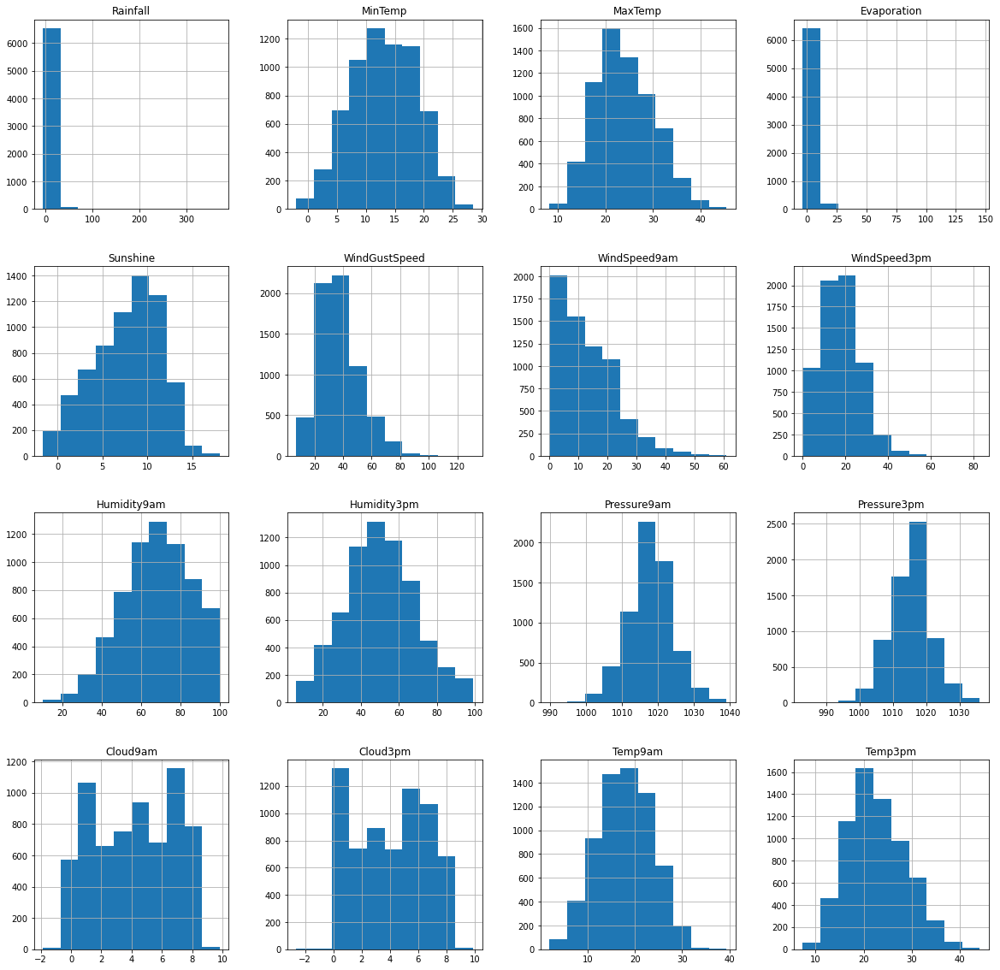

In [132]:
import matplotlib.pyplot as plt
df.hist(figsize=(20,20))
plt.show()

To understand properly we need to review each feature individually but this graph is just for showing the trend with histplot only numeric features shown

# Splitting the columns with categorical and numerica data

In [20]:
# We are defining numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 16 numerical features : ['Rainfall', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

We have 7 categorical features : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [21]:
df_visualization_continuous=df[['Rainfall', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']].copy()

In [22]:
df_visualization_nominal=df[['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']]

# Visualization of the distribution of the continuous value of the float and int columns.

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings('ignore')

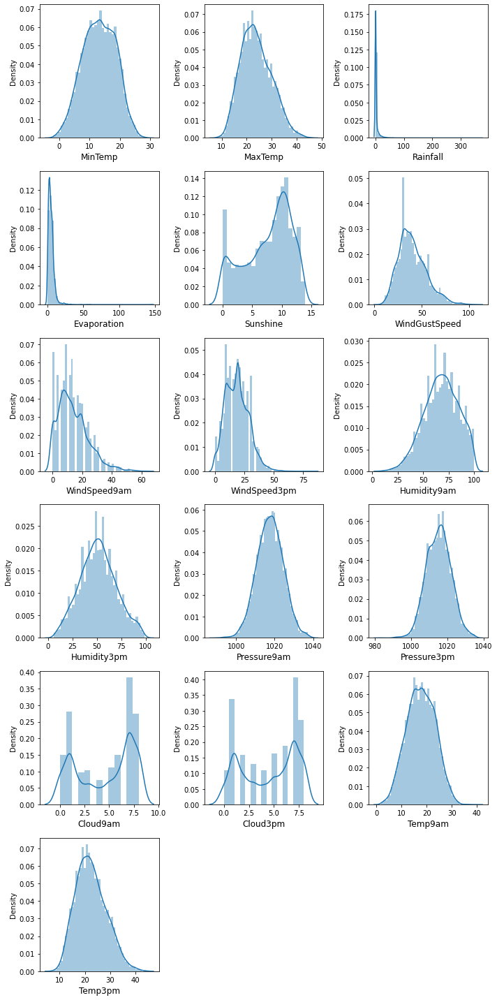

In [135]:
#Lets see how the data is distributed for every column

plt.figure(figsize =(10,20), facecolor = 'white')
plotnumber = 1

for column in df_visualization_continuous:
    if plotnumber <=16:
        ax = plt.subplot(6,3,plotnumber)
        sns.distplot(df_visualization_continuous[column])
        plt.xlabel(column,fontsize = 12)
        
    plotnumber +=1
plt.tight_layout()

# Observations :-
    
   - We see that the columns Evaporation,Windspeed9am,wind gust speed , humidity 9am  having some skewness and need to be treated
   
   - Overall we see that we have a really good dataset with all the features having very normal distribution overall

## Treating the 1st target variable-RainTomorrow where we give Y 1 and we give N 0 - CLASSIFICATION Problem

In [136]:
df['RainTomorrow'].unique() #Checking to see what the columns are in the null columns

array(['No', 'Yes'], dtype=object)

In [24]:
df['RainTomorrow'] = df['RainTomorrow'].factorize(['Y', 'N' ])[0]

In [138]:
df

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,2008-12-01,Albury,W,W,WNW,No,0,0.6,13.4,22.9,...,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8
1,2008-12-02,Albury,WNW,NNW,WSW,No,0,0.0,7.4,25.1,...,4.0,22.0,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3
2,2008-12-03,Albury,WSW,W,WSW,No,0,0.0,12.9,25.7,...,19.0,26.0,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2
3,2008-12-04,Albury,NE,SE,E,No,0,0.0,9.2,28.0,...,11.0,9.0,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5
4,2008-12-05,Albury,W,ENE,NW,No,0,1.0,17.5,32.3,...,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,2017-06-20,Uluru,E,ESE,E,No,0,0.0,3.5,21.8,...,15.0,13.0,59.0,27.0,1024.7,1021.2,1.697899,2.106836,9.4,20.9
8420,2017-06-21,Uluru,E,SE,ENE,No,0,0.0,2.8,23.4,...,13.0,11.0,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4
8421,2017-06-22,Uluru,NNW,SE,N,No,0,0.0,3.6,25.3,...,13.0,9.0,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5
8422,2017-06-23,Uluru,N,SE,WNW,No,0,0.0,5.4,26.9,...,9.0,9.0,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1


## Visualizing the Target Variable 

0    5056
1    1575
Name: RainTomorrow, dtype: int64


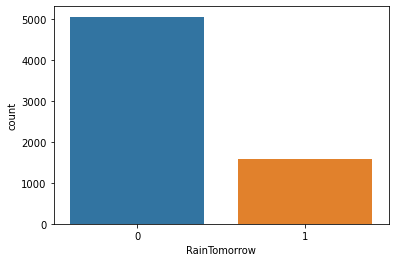

In [142]:
ax = sns.countplot(x='RainTomorrow',data = df_visualization_nominal)
print(df_visualization_nominal['RainTomorrow'].value_counts())

0    5056
1    1575
Name: RainTomorrow, dtype: int64


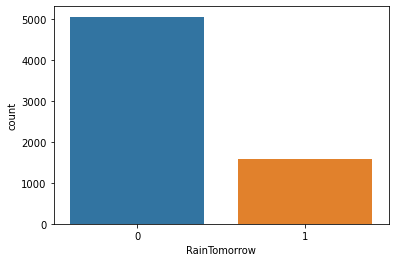

In [143]:
ax = sns.countplot(x='RainTomorrow',data = df)
print(df['RainTomorrow'].value_counts())

In [145]:
import plotly.graph_objs as go
import plotly.offline as py
less_50 = df[(df['RainTomorrow'] != 0)]
more_50 = df[(df['RainTomorrow'] == 0)]

trace = go.Pie(labels = ['ITs not going to rain is No', 'Its going to rain is Yes'], values = df['RainTomorrow'].value_counts(), 
               textfont=dict(size=15),
               marker=dict(colors=['#B9C0C9','yellow'], 
               line=dict(color='#000000', width=1.5)))
layout = dict(title =  'Distribution of RainTomorrow variable')          
fig = dict(data = [trace], layout=layout)
py.iplot(fig) 

Observations :-

We see a huge imbalance in the label column where the applicants whose loan is approved is 76.2% and the ones whose isnt is 23.8% so we need to balance this otherwise the model will be biased 

## Lets graph the data for columns individually so we can make clear findings

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

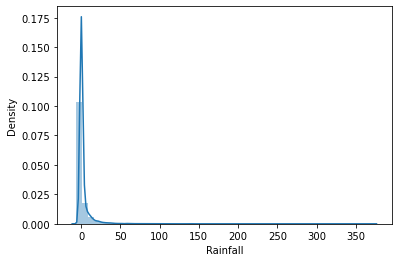

In [147]:
sns.distplot(df_visualization_continuous['Rainfall'],kde=True,)

<AxesSubplot:xlabel='Rainfall', ylabel='Count'>

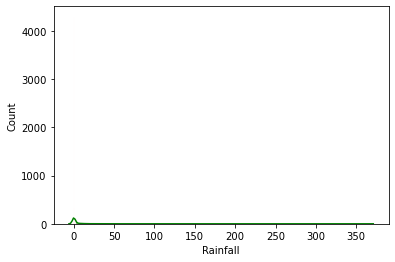

In [153]:
sns.histplot(x=df_visualization_continuous['Rainfall'], ec = "gold", color='g', kde=True)

We see that the data is right skewed and we many outliers in the dataset , we see the max range is 0-350 approx , need to treat to get a better look at the data but as this is a target variable we will only treat it for the 1st label 

<AxesSubplot:xlabel='Rainfall', ylabel='count'>

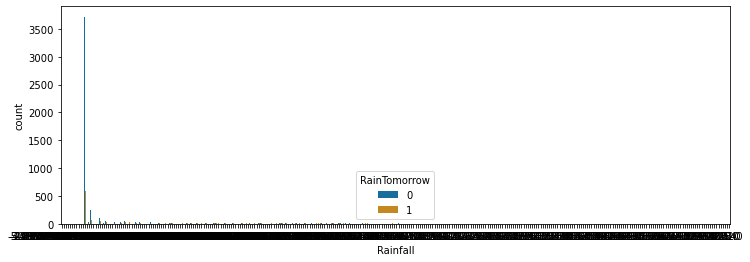

In [149]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Rainfall", hue="RainTomorrow", data=df, palette="colorblind")

In [151]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Rainfall', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Rainfall by RainTomorrow Status',
                  xaxis_title='Rainfall, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Again we see that as the data is conjusted witihn 0-10 we are not able to pinpoint any pattern or trend showing what affects it raining tomorrow need to treat this with zscore indefenitely. 

<AxesSubplot:xlabel='MinTemp', ylabel='Density'>

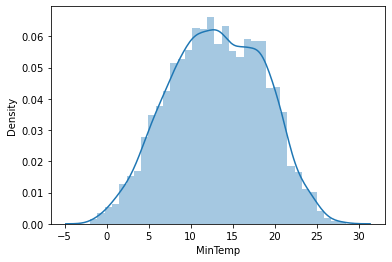

In [156]:
sns.distplot(df['MinTemp'],kde=True,)

<AxesSubplot:xlabel='MinTemp', ylabel='Count'>

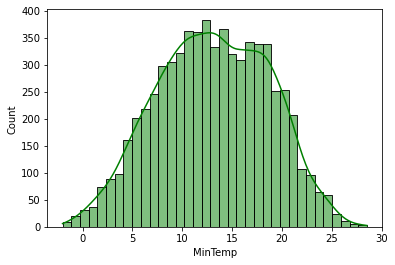

In [157]:
sns.histplot(x=df.MinTemp, ec = "black", color='g', kde=True)

We see that we have a very good normal distribution in this feature we see high between 10 to 20 approx 

<AxesSubplot:xlabel='MinTemp', ylabel='count'>

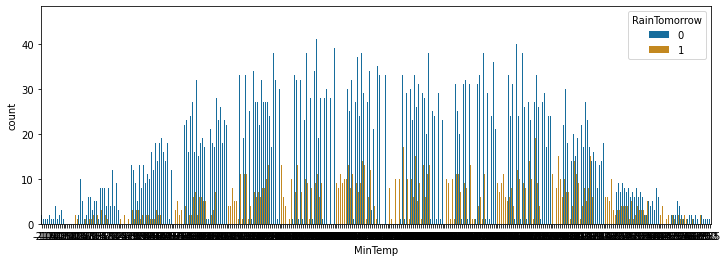

In [155]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="MinTemp", hue="RainTomorrow", data=df, palette="colorblind")

In [154]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='MinTemp', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of MinTemp by RainTomorrow Status',
                  xaxis_title='MinTemp, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that the rain is affected by the temp and we see that there is more chance of it raining if the temp is between 10 to 20 

<AxesSubplot:xlabel='MaxTemp', ylabel='Density'>

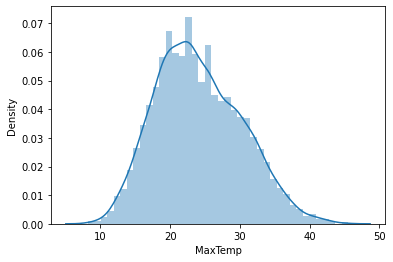

In [158]:
sns.distplot(df['MaxTemp'],kde=True,)

<AxesSubplot:xlabel='MaxTemp', ylabel='Count'>

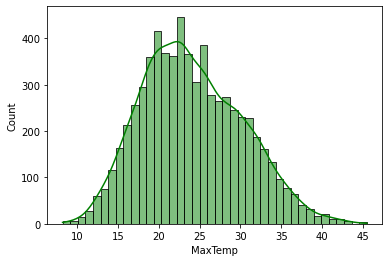

In [159]:
sns.histplot(x=df['MaxTemp'], ec = "black", color='g', kde=True)

We see that like the min temp the max is also having a really goo distribution , we see the majority of the data falls between 17.5 to 26 approx

<AxesSubplot:xlabel='MaxTemp', ylabel='count'>

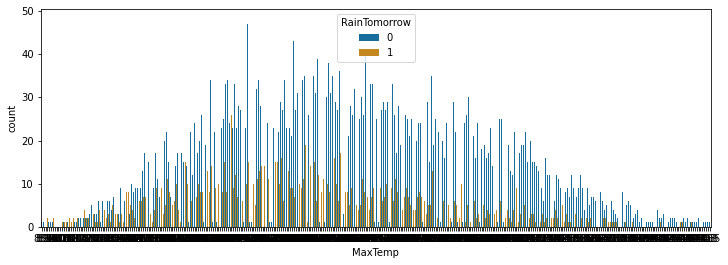

In [160]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="MaxTemp", hue="RainTomorrow", data=df, palette="colorblind")

In [161]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='MaxTemp', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of MaxTemp by RainTomorrow Status',
                  xaxis_title='MaxTemp, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Just like the data shown in the distplot we see that the temp for rain showd be within 25 as seen in before and as it goes higher the chances of rain are getting lesser

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

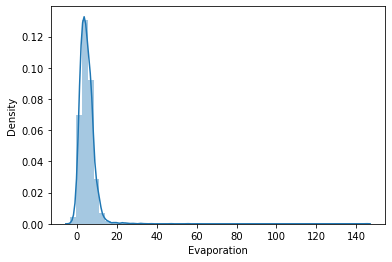

In [162]:
sns.distplot(df['Evaporation'],kde=True,)

<AxesSubplot:xlabel='Evaporation', ylabel='Count'>

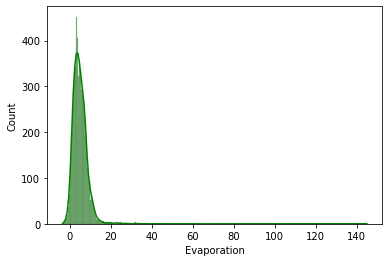

In [163]:
sns.histplot(x=df['Evaporation'], ec = "black", color='g', kde=True)

We see that the data is right skewed and we see that the range lies from 0 to 140 , we need to treat the outliers or it will affect the model

<AxesSubplot:xlabel='Evaporation', ylabel='count'>

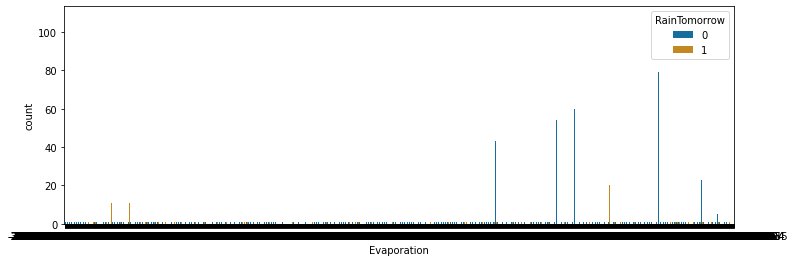

In [164]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Evaporation", hue="RainTomorrow", data=df, palette="colorblind")

In [165]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Evaporation', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Evaporation by RainTomorrow Status',
                  xaxis_title='Evaporation, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Just like the univariate analysis we see that there isnt any trend or observations we can analyze ,due to the skewness of the column, but we see that the higher chances lies when the rates is within 8 or 10 approx 

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

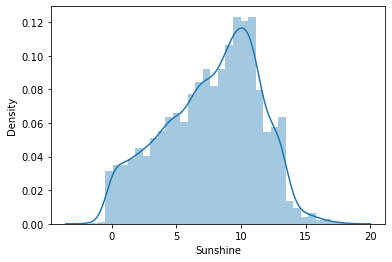

In [167]:
sns.distplot(df['Sunshine'],kde=True,)

<AxesSubplot:xlabel='Sunshine', ylabel='Count'>

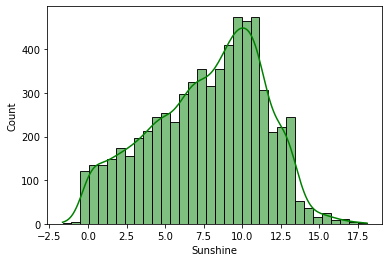

In [168]:
sns.histplot(x=df['Sunshine'], ec = "black", color='g', kde=True)

We see that sunshine is pretty normally distributed the higher range is 10 to 12 approx

<AxesSubplot:xlabel='Sunshine', ylabel='count'>

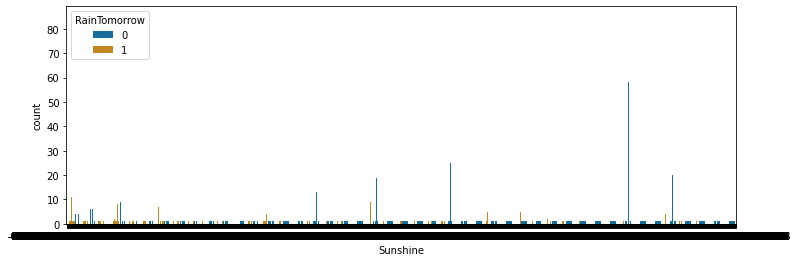

In [169]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Sunshine", hue="RainTomorrow", data=df, palette="colorblind")

In [170]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Sunshine', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Sunshine by RainTomorrow Status',
                  xaxis_title='Sunshine, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that the lower the rate of Sunshine the higher the chances of rain, we see a highest peak in rain chance from 0 to 1 approx which is a really valuable observation and trend

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

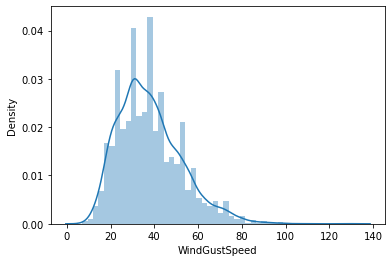

In [171]:
sns.distplot(df['WindGustSpeed'],kde=True,)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Count'>

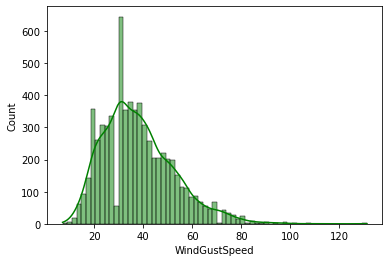

In [172]:
sns.histplot(x=df['WindGustSpeed'], ec = "black", color='g', kde=True)

Wesee the data is lighly skwed to the right but overall the data has a really equally distributed , the highest range is 25-26 approx

<AxesSubplot:xlabel='WindGustSpeed', ylabel='count'>

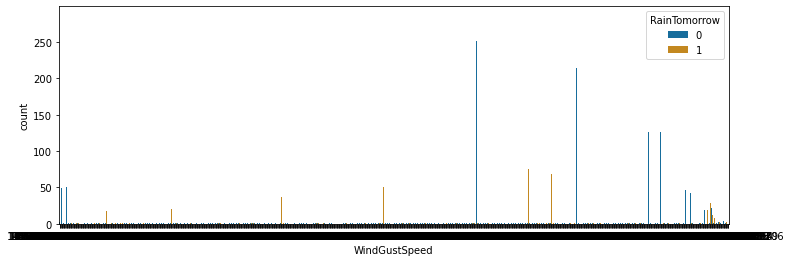

In [173]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindGustSpeed", hue="RainTomorrow", data=df, palette="colorblind")

In [174]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='WindGustSpeed', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of WindGustSpeed by RainTomorrow Status',
                  xaxis_title='WindGustSpeed, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that the rain is having higher chance in between range 30 to 60 approx 

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

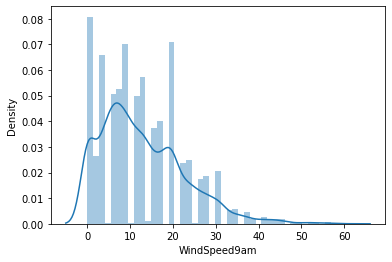

In [176]:
sns.distplot(df['WindSpeed9am'],kde=True,)

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Count'>

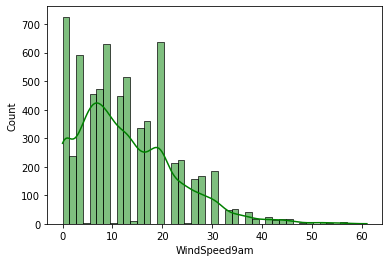

In [177]:
sns.histplot(x=df['WindSpeed9am'], ec = "black", color='g', kde=True)

Here we see right skewed data and we see that the volume of variables are very less, we see the highest here is 0 

<AxesSubplot:xlabel='WindSpeed9am', ylabel='count'>

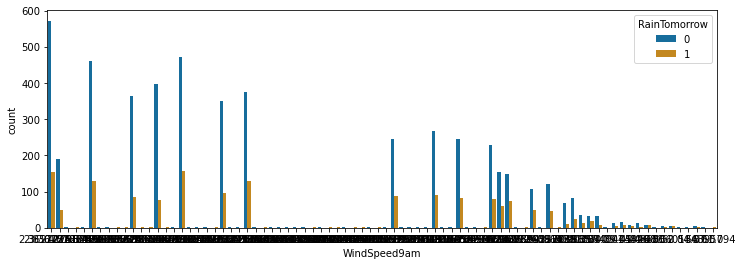

In [175]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindSpeed9am", hue="RainTomorrow", data=df, palette="colorblind")

In [178]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='WindSpeed9am', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of WindSpeed9am by RainTomorrow Status',
                  xaxis_title='WindSpeed9am, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that the chances are pretty evenly spread out from 0 to 15 approx and after that it keep diminishing , but overall does not show a massive trend or pattern

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Density'>

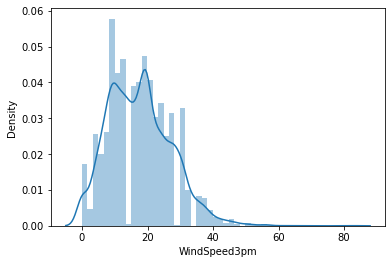

In [181]:
sns.distplot(df['WindSpeed3pm'],kde=True,)

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Count'>

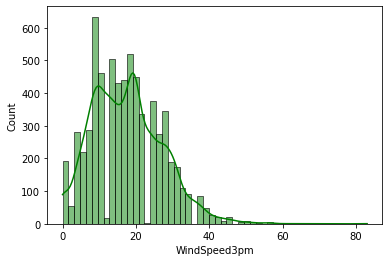

In [182]:
sns.histplot(x=df['WindSpeed3pm'], ec = "black", color='g', kde=True)

We see that the data is somewhat skewed again but less outliers otherwise we see a very normal distribution , we see that the highest is 17 to 18 approx

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='count'>

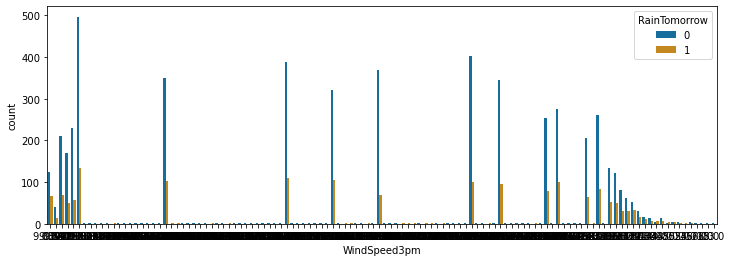

In [183]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindSpeed3pm", hue="RainTomorrow", data=df, palette="colorblind")

In [184]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='WindSpeed3pm', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of WindSpeed3pm by RainTomorrow Status',
                  xaxis_title='WindSpeed3pm, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that the data shows that the highest chances fall bbetween 10 25 approx and as it goes higher the cahnces also go down

<AxesSubplot:xlabel='Humidity9am', ylabel='Density'>

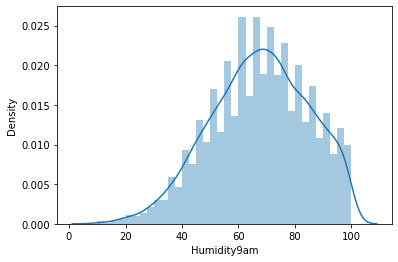

In [185]:
sns.distplot(df['Humidity9am'],kde=True,)

<AxesSubplot:xlabel='Humidity9am', ylabel='Count'>

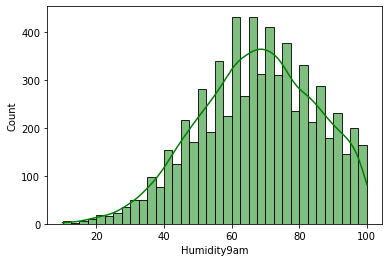

In [186]:
sns.histplot(x=df['Humidity9am'], ec = "black", color='g', kde=True)

We see some left skewness in the data and we need to treat this as well in order to reduce variance , we see the highest range falls  between 60 to 80 

<AxesSubplot:xlabel='Humidity9am', ylabel='count'>

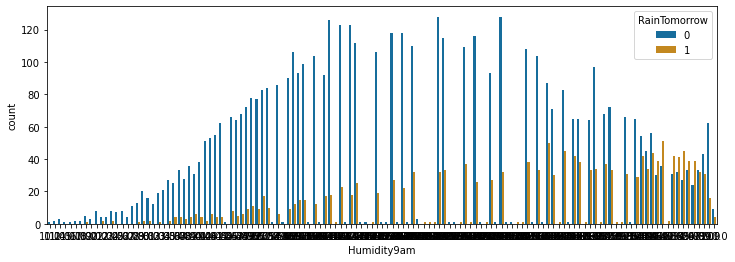

In [187]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Humidity9am", hue="RainTomorrow", data=df, palette="colorblind")

In [188]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Humidity9am', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Humidity9am by RainTomorrow Status',
                  xaxis_title='Humidity9am, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see a very interresting pattern here , we see that the higher the humidity , higher the chances of rain , and vice versa, its a really strong trend we see here 

<AxesSubplot:xlabel='Humidity3pm', ylabel='Density'>

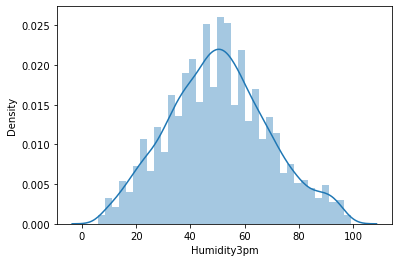

In [189]:
sns.distplot(df['Humidity3pm'],kde=True,)

<AxesSubplot:xlabel='Humidity3pm', ylabel='Count'>

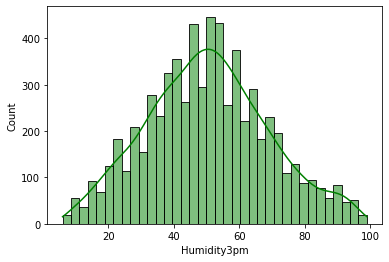

In [190]:
sns.histplot(x=df['Humidity3pm'], ec = "black", color='g', kde=True)

We see a very good example of a  normally distributed data in this column, we see the highs are from 40 to 60

<AxesSubplot:xlabel='Humidity3pm', ylabel='count'>

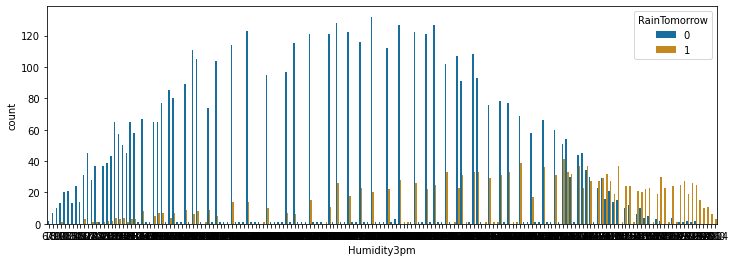

In [191]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Humidity3pm", hue="RainTomorrow", data=df, palette="colorblind")

In [192]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Humidity3pm', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Humidity3pm by RainTomorrow Status',
                  xaxis_title='Humidity3pm, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Again we see that the higher the humidity the higher the chances of rain

<AxesSubplot:xlabel='Pressure9am', ylabel='Density'>

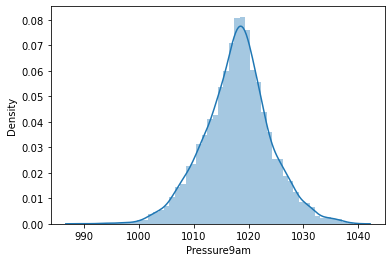

In [193]:
sns.distplot(df['Pressure9am'],kde=True,)

<AxesSubplot:xlabel='Pressure9am', ylabel='Count'>

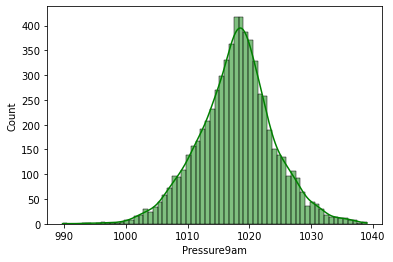

In [194]:
sns.histplot(x=df['Pressure9am'], ec = "black", color='g', kde=True)

We see the data resenmbles a tree structure which shows a really good distribution of data , we see the highs are between 1010 and 1030

<AxesSubplot:xlabel='Pressure9am', ylabel='count'>

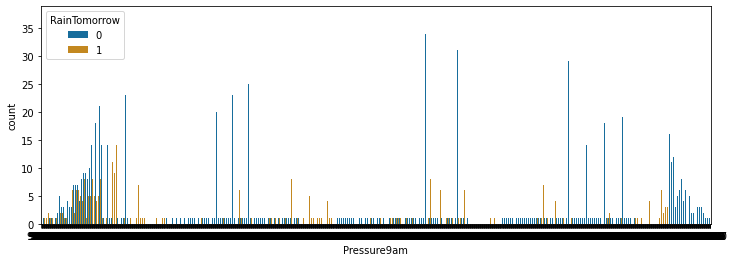

In [195]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Pressure9am", hue="RainTomorrow", data=df, palette="colorblind")

In [196]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Pressure9am', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Pressure9am by RainTomorrow Status',
                  xaxis_title='Pressure9am, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see that in this dataset , the level of pressure needs to be exact and not too less or too much , the ideal spot seen here is 1010 to 1022

<AxesSubplot:xlabel='Pressure3pm', ylabel='Density'>

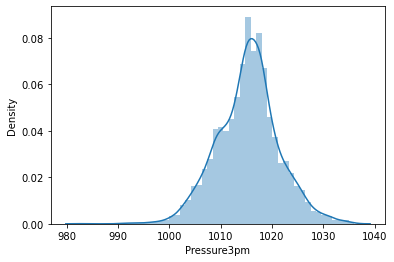

In [197]:
sns.distplot(df['Pressure3pm'],kde=True,)

<AxesSubplot:xlabel='Pressure3pm', ylabel='Count'>

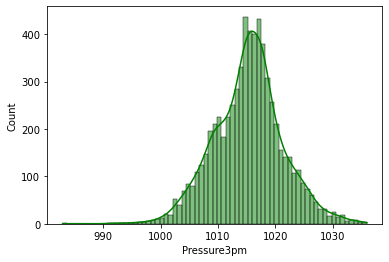

In [198]:
sns.histplot(x=df['Pressure3pm'], ec = "black", color='g', kde=True)

the daa in the column is left skewed a little , appart from that the majority of the data falls in 1010 to 1020

<AxesSubplot:xlabel='Pressure3pm', ylabel='count'>

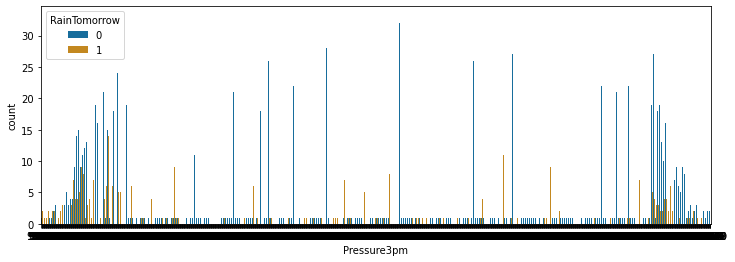

In [199]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Pressure3pm", hue="RainTomorrow", data=df, palette="colorblind")

In [200]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Pressure3pm', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Pressure3pm by RainTomorrow Status',
                  xaxis_title='Pressure3pm, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see the same trend here where the ideal pressure amount is 1010 to 1015 here 

<AxesSubplot:xlabel='Cloud9am', ylabel='Density'>

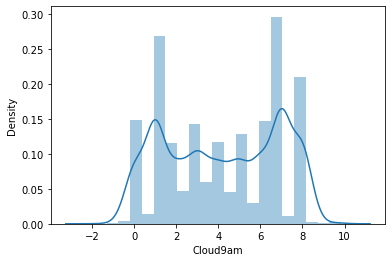

In [201]:
sns.distplot(df['Cloud9am'],kde=True,)

<AxesSubplot:xlabel='Cloud9am', ylabel='Count'>

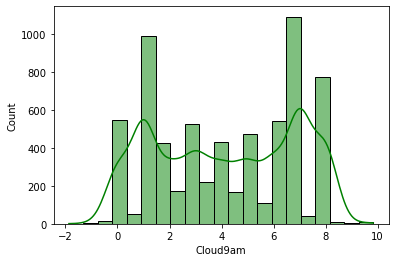

In [202]:
sns.histplot(x=df['Cloud9am'], ec = "black", color='g', kde=True)

We see that this column has categorical like feature and we see that the highest category is 7 and 1

<AxesSubplot:xlabel='Cloud9am', ylabel='count'>

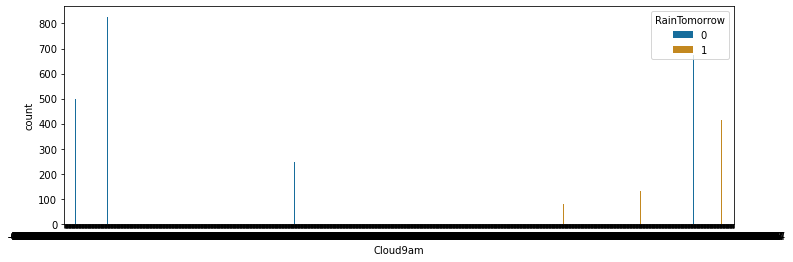

In [203]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Cloud9am", hue="RainTomorrow", data=df, palette="colorblind")

In [204]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Cloud9am', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Cloud9am by RainTomorrow Status',
                  xaxis_title='Cloud9am, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

We see avery strong pattern here , where the highest no of cloud coverage is giving the highest chance of rain

<AxesSubplot:xlabel='Cloud3pm', ylabel='Density'>

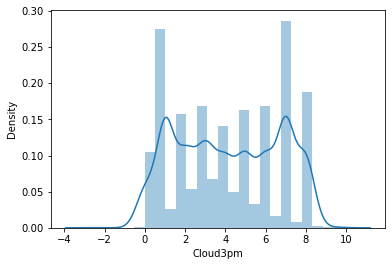

In [205]:
sns.distplot(df['Cloud3pm'],kde=True,)

<AxesSubplot:xlabel='Cloud3pm', ylabel='Count'>

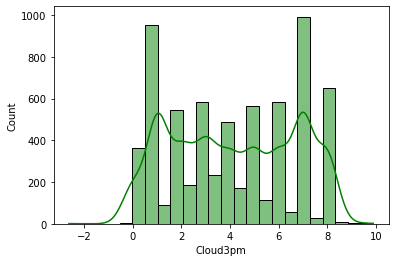

In [206]:
sns.histplot(x=df['Cloud3pm'], ec = "black", color='g', kde=True)

Here too we see a strong relationship with the previous column an dwe see that 1 and 7 are the highest very identical it is 

<AxesSubplot:xlabel='Cloud3pm', ylabel='count'>

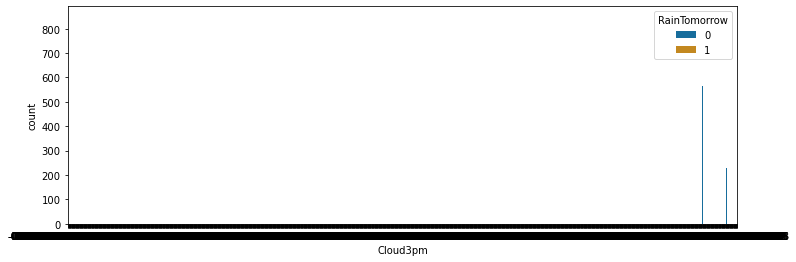

In [207]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Cloud3pm", hue="RainTomorrow", data=df, palette="colorblind")

In [208]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Cloud3pm', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Cloud3pm by RainTomorrow Status',
                  xaxis_title='Cloud3pm, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Same as before we see that the pattern shows that the highest chance is at the highest cloud coverage in the sky

<AxesSubplot:xlabel='Temp9am', ylabel='Density'>

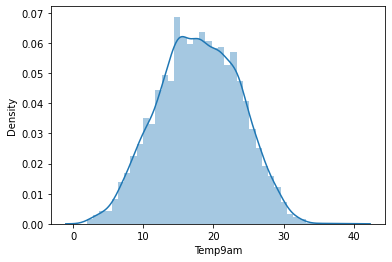

In [209]:
sns.distplot(df['Temp9am'],kde=True,)

<AxesSubplot:xlabel='Temp9am', ylabel='Count'>

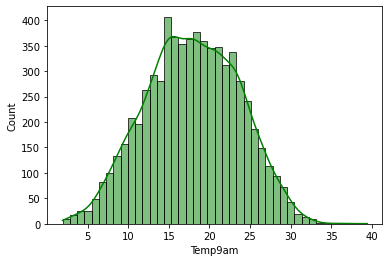

In [210]:
sns.histplot(x=df['Temp9am'], ec = "black", color='g', kde=True)

We see that the data is noramally distributed , we see the hig range falls between 15 and 25

<AxesSubplot:xlabel='Temp9am', ylabel='count'>

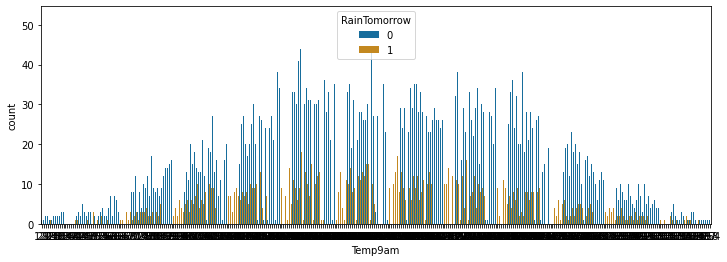

In [211]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Temp9am", hue="RainTomorrow", data=df, palette="colorblind")

In [212]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Temp9am', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Temp9am by RainTomorrow Status',
                  xaxis_title='Temp9am, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

Wesee that teh temp also shows a strong pattern where the ideal temp of 14 to 22 approx is ideal for rain

<AxesSubplot:xlabel='Temp3pm', ylabel='Density'>

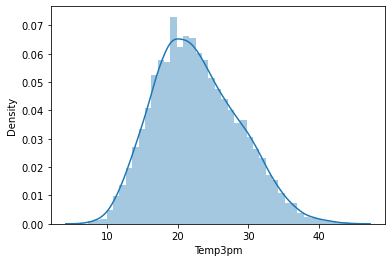

In [213]:
sns.distplot(df['Temp3pm'],kde=True,)

<AxesSubplot:xlabel='Temp3pm', ylabel='Count'>

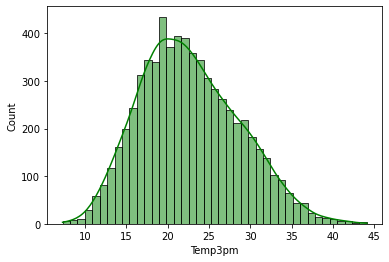

In [214]:
sns.histplot(x=df['Temp3pm'], ec = "black", color='g', kde=True)

Same as the previous column we see the highs are 20 to 27 approx here 

<AxesSubplot:xlabel='Temp3pm', ylabel='count'>

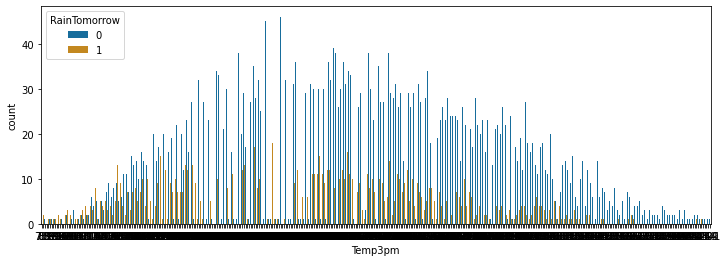

In [215]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Temp3pm", hue="RainTomorrow", data=df, palette="colorblind")

In [216]:
import plotly.express as px
plot_df=df.sort_values(by="RainTomorrow")
fig=px.histogram(plot_df, x='Temp3pm', color='RainTomorrow', 
                 opacity=0.8, histnorm='density', barmode='overlay', marginal='box',
                 color_discrete_map={'No': '#B9C0C9','Yes': '#CDBBA7'})
fig.update_layout(title_text='Distribution of Temp3pm by RainTomorrow Status',
                  xaxis_title='Temp3pm, $', yaxis_title='Density',font_color='#28221D',
                  paper_bgcolor='#F4F2F0', plot_bgcolor='#F4F2F0', legend_traceorder='reversed')
fig.show()

In this data we see that the ideal temperature is modderate for rain from 15 to 25 is where the highes chance of rain falls here

### MULTIVARIATE ANALYSIS -WITH PAIRPLOT

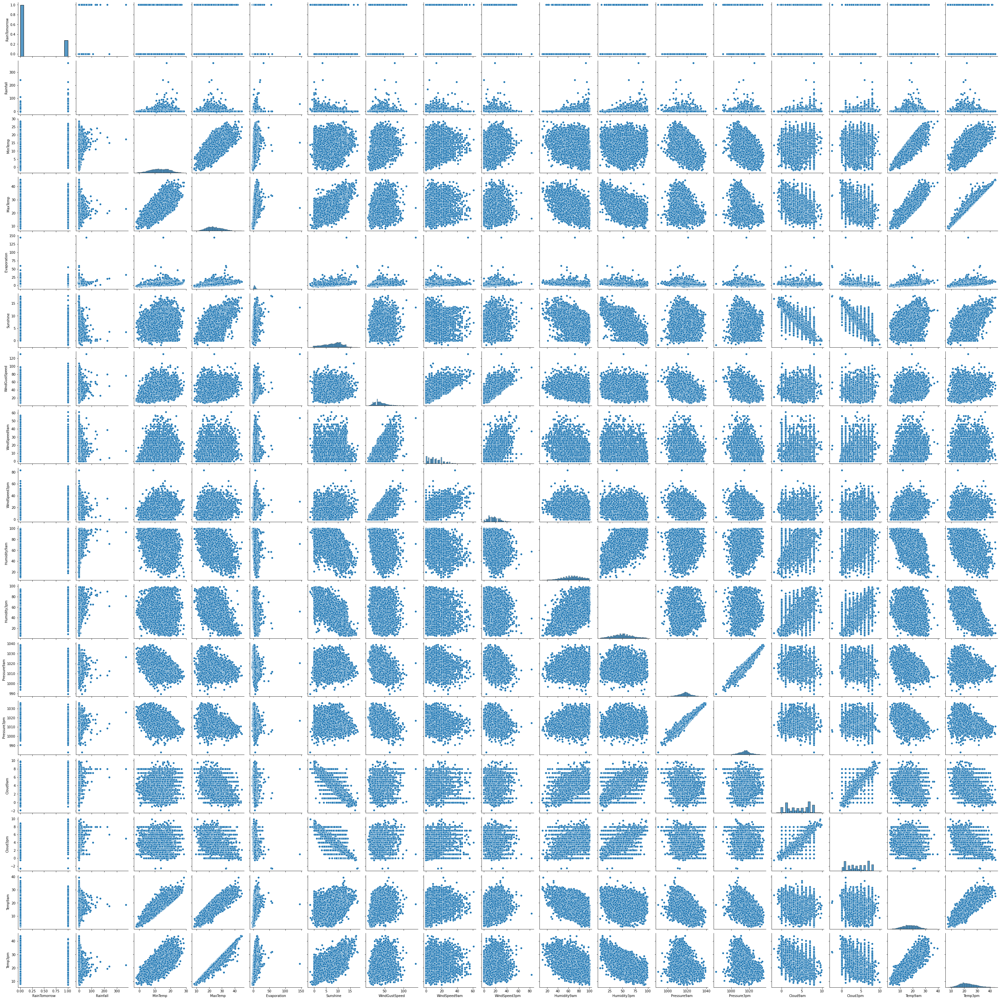

In [217]:
sns.pairplot(df)

## We see a number of observation in the pairplot , but the relationship is very hard to pinpoint so we will need to plot different relationship plots to find the actual relationship between the columns

# Visualization of the categorical features

Date needs to be treated is an index so we wont visualize than as all values are unique to each other. and will not be usful till we treat it to see realtionship with other features and label 

PerthAirport    1204
Albury           898
Newcastle        808
Melbourne        752
CoffsHarbour     610
Williamtown      581
Brisbane         574
Penrith          479
Darwin           250
Wollongong       236
Adelaide         201
Uluru             38
Name: Location, dtype: int64


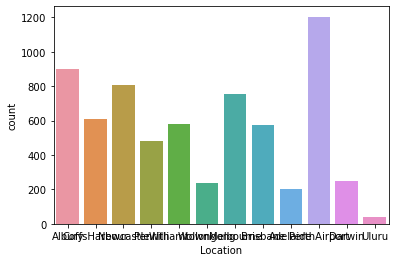

In [221]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='Location',data = df,)
print(df['Location'].value_counts())

We see different locations in Australia and we see that the recording made in the dataset , we see the highest a Perth Airport

<AxesSubplot:xlabel='Location', ylabel='count'>

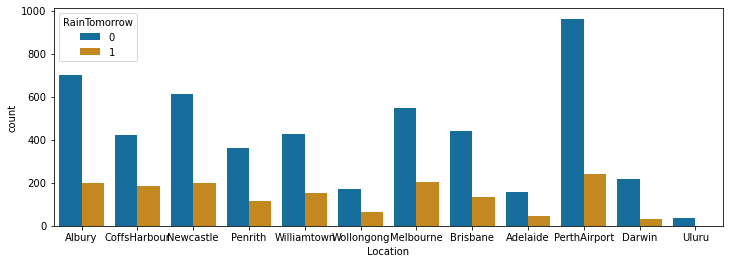

In [222]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="Location", hue="RainTomorrow", data=df, palette="colorblind")

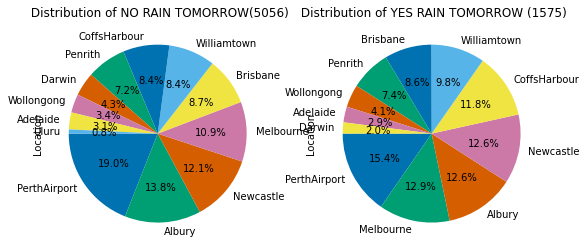

In [220]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["Location"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["Location"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

We see that the perth airport has the highest instances of rain compared to the rest and melbourne as well coming in close to the leader

N      1355
E       518
SW      456
W       427
WSW     414
WNW     390
SSE     379
SE      365
S       360
ENE     350
NE      299
SSW     295
NW      289
NNE     285
ESE     265
NNW     184
Name: WindGustDir, dtype: int64


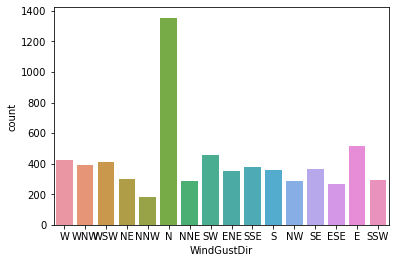

In [223]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindGustDir',data = df)
print(df['WindGustDir'].value_counts())

WE see that the highest direction of wind is North here almost equal to half of the rest

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

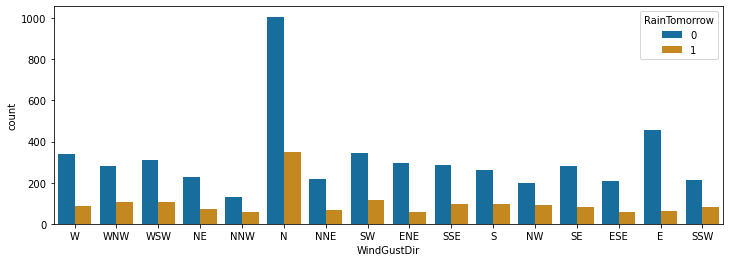

In [224]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindGustDir", hue="RainTomorrow", data=df, palette="colorblind")

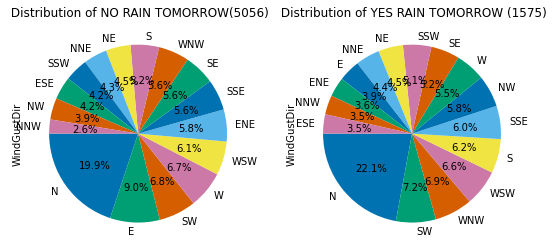

In [225]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindGustDir"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindGustDir"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

As we saw in the countplot the N wind direction has the highest chance of rain by a huge margin

N      1369
SW      581
NW      452
SE      436
ENE     395
WSW     380
SSW     360
NE      359
E       332
NNE     332
S       316
WNW     296
SSE     295
W       294
ESE     226
NNW     208
Name: WindDir9am, dtype: int64


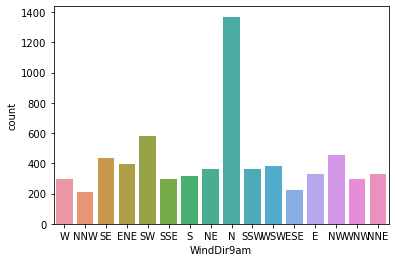

In [226]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindDir9am',data = df)
print(df['WindDir9am'].value_counts())

We see similar characteristiccs like the previous feature where N north is the highest by a long difference

<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

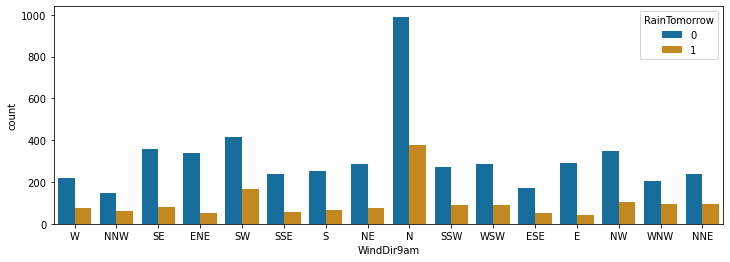

In [227]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindDir9am", hue="RainTomorrow", data=df, palette="colorblind")

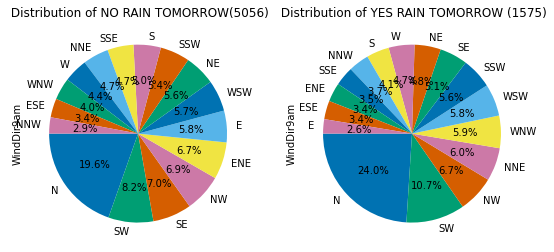

In [228]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindDir9am"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindDir9am"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

Again we see that the N North category has the highest chance and has the highest number as well in the column

SE     945
WSW    490
NE     478
S      473
SW     422
SSE    410
NW     396
W      393
E      386
WNW    382
ESE    359
N      347
ENE    338
NNE    302
SSW    271
NNW    239
Name: WindDir3pm, dtype: int64


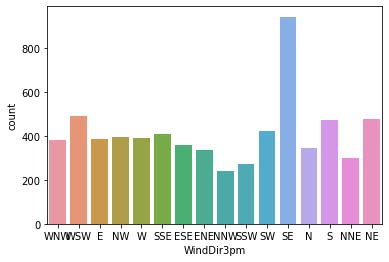

In [229]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='WindDir3pm',data = df_visualization_nominal)
print(df_visualization_nominal['WindDir3pm'].value_counts())

Here we see a slight change where the highest is South East

<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

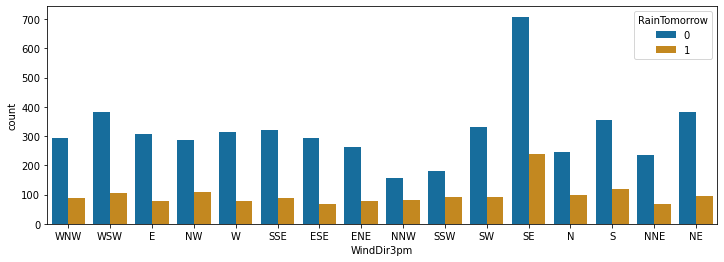

In [230]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="WindDir3pm", hue="RainTomorrow", data=df, palette="colorblind")

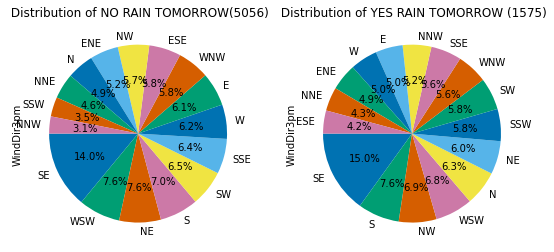

In [231]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["WindDir3pm"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["WindDir3pm"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

Wesee that the SE being the highest has more instances of rain compared to the rest in thsi analysis

No     5077
Yes    1554
Name: RainToday, dtype: int64


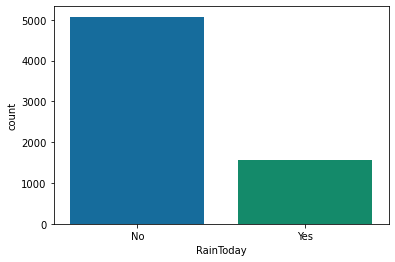

In [232]:
#Lets see the representation individually now with each column 

ax = sns.countplot(x='RainToday',data = df_visualization_nominal)
print(df_visualization_nominal['RainToday'].value_counts())

We see strikingly accurate and same results with the label where the no of times it doesnt rains much much higher that the times it rains 

<AxesSubplot:xlabel='RainToday', ylabel='count'>

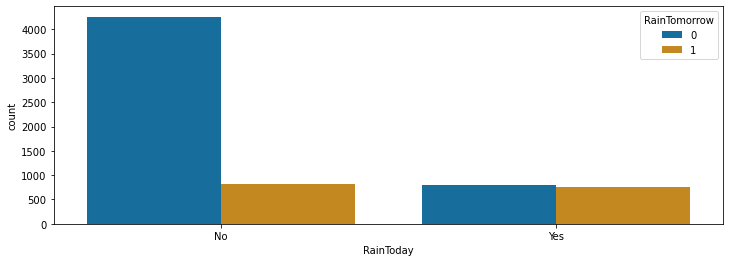

In [233]:
import matplotlib.pyplot as plt
plt.subplots(figsize=(12,4))
sns.countplot(x="RainToday", hue="RainTomorrow", data=df, palette="colorblind")

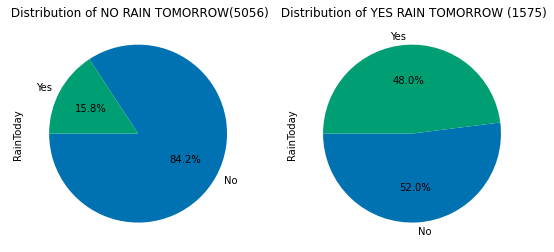

In [234]:
yes_group = df[df["RainTomorrow"]== 0]
no_group = df[df["RainTomorrow"]!= 0]

fig=plt.figure(figsize=(9,9))
plt.style.use('seaborn-colorblind')
fig.add_subplot(2,2,1)
yes_group["RainToday"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of NO RAIN TOMORROW('+str(len(yes_group))+')');

fig.add_subplot(2,2,2)
no_group["RainToday"].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%', startangle=180)

plt.title(' Distribution of YES RAIN TOMORROW ('+str(len(no_group))+')');

We see that the yes is strikingly similar to the label having the same metric this column may be the highest correlation with the label

# Encoding the categorical Features to numerical features

### Treating the Data columsn and extracting the month and year 

In [25]:
df["Date_month"] = pd.to_datetime(df["Date"], format = "%Y/%m/%d").dt.month # extracting the month

In [26]:
df["Date_year"] = pd.to_datetime(df["Date"], format = "%Y/%m/%d").dt.year # extracting the year

In [262]:
df.shape

(6631, 25)

In [27]:
df.drop(columns = ['Date'],inplace=True)

In [28]:
df.dtypes

Location          object
WindGustDir       object
WindDir9am        object
WindDir3pm        object
RainToday         object
RainTomorrow       int64
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
Date_month         int64
Date_year          int64
dtype: object

In [29]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()

In [30]:
for i in df.columns:
    if df[i].dtypes == "object":
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))


In [31]:
df.dtypes

Location           int32
WindGustDir        int32
WindDir9am         int32
WindDir3pm         int32
RainToday          int32
RainTomorrow       int64
Rainfall         float64
MinTemp          float64
MaxTemp          float64
Evaporation      float64
Sunshine         float64
WindGustSpeed    float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
Date_month         int64
Date_year          int64
dtype: object

We have converted the categorical data to numerical data we can move ahead to the next step

# Visualizing the relationship between the features and the 1st  target variable - Raintomorrow

In [41]:
#Divide data into features and label

x = df.drop(columns = ['RainTomorrow'])
y = df['RainTomorrow']

In [290]:
x

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0.6,13.4,22.9,5.146735,6.567859,...,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8,12,2008
1,1,14,6,15,0,0.0,7.4,25.1,5.824202,12.406433,...,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3,12,2008
2,1,15,13,15,0,0.0,12.9,25.7,7.243981,11.820881,...,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0.0,9.2,28.0,5.406861,12.886565,...,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5,12,2008
4,1,13,1,7,0,1.0,17.5,32.3,5.333187,6.369314,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,0,2,0,0,0.0,3.5,21.8,3.431302,10.748262,...,59.0,27.0,1024.7,1021.2,1.697899,2.106836,9.4,20.9,6,2017
8420,9,0,9,1,0,0.0,2.8,23.4,4.079790,11.912692,...,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4,6,2017
8421,9,6,9,3,0,0.0,3.6,25.3,3.812303,12.548026,...,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5,6,2017
8422,9,3,9,14,0,0.0,5.4,26.9,5.611019,12.315648,...,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1,6,2017


In [291]:
y

0       0
1       0
2       0
3       0
4       0
       ..
8419    0
8420    0
8421    0
8422    0
8423    0
Name: RainTomorrow, Length: 6631, dtype: int64

# Scatter plot

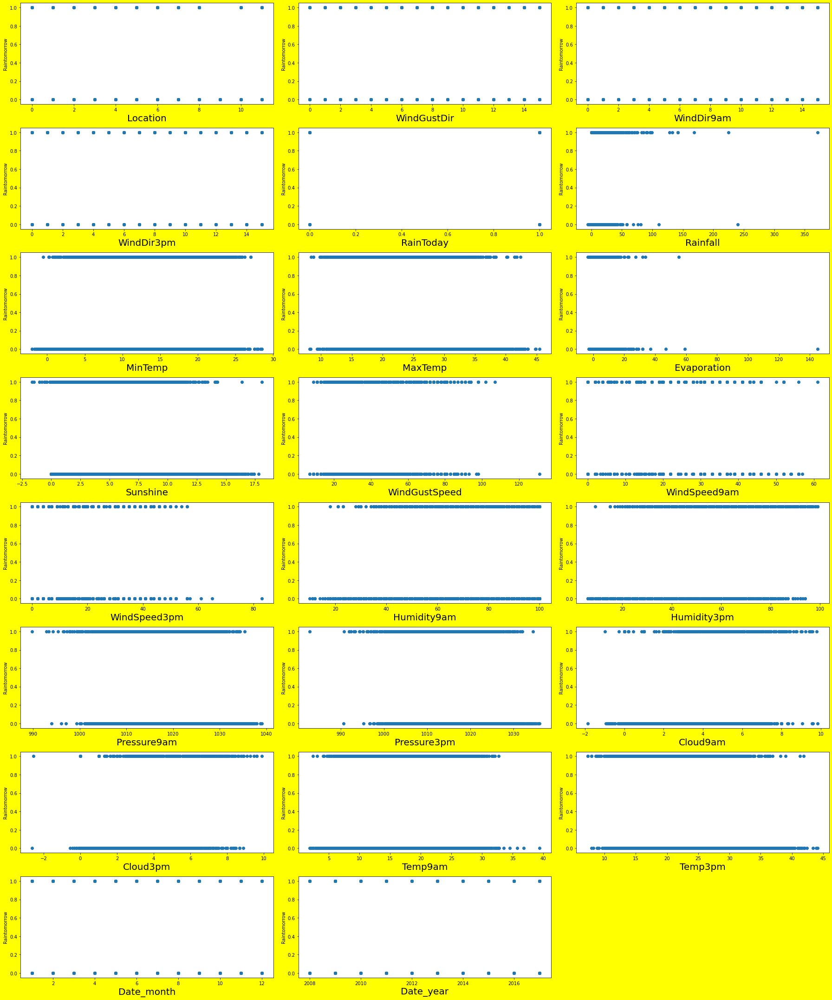

In [42]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'yellow')
plotnumber = 1

for column in x:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Raintomorrow',fontsize = 10)
    plotnumber +=1
plt.tight_layout()


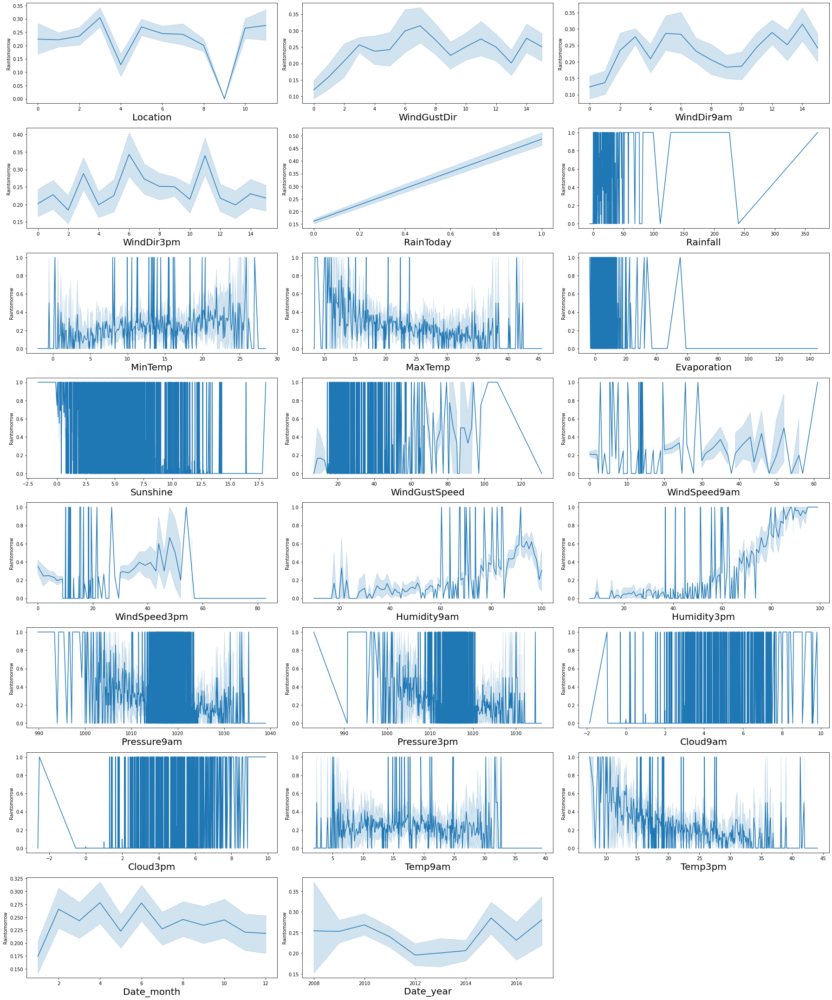

In [43]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'white')
plotnumber = 1

for column in x:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        sns.lineplot(x[column],y)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Raintomorrow',fontsize = 10)
    plotnumber +=1
plt.tight_layout()

We see that the stripplot is showing use binary relationship as its a classification problem , but the line plot is showing some good graphs we see some positive relationships inlocation in windgustdir, winddir9am ans winddir3pm and month and day the other columns dont show a up or down trend

# Visualizing the relationship between the features and the 2nd  target variable - Rainfall

In [35]:
#Divide data into features and label

x1 = df.drop(columns = ['Rainfall'])
y1 = df['Rainfall']

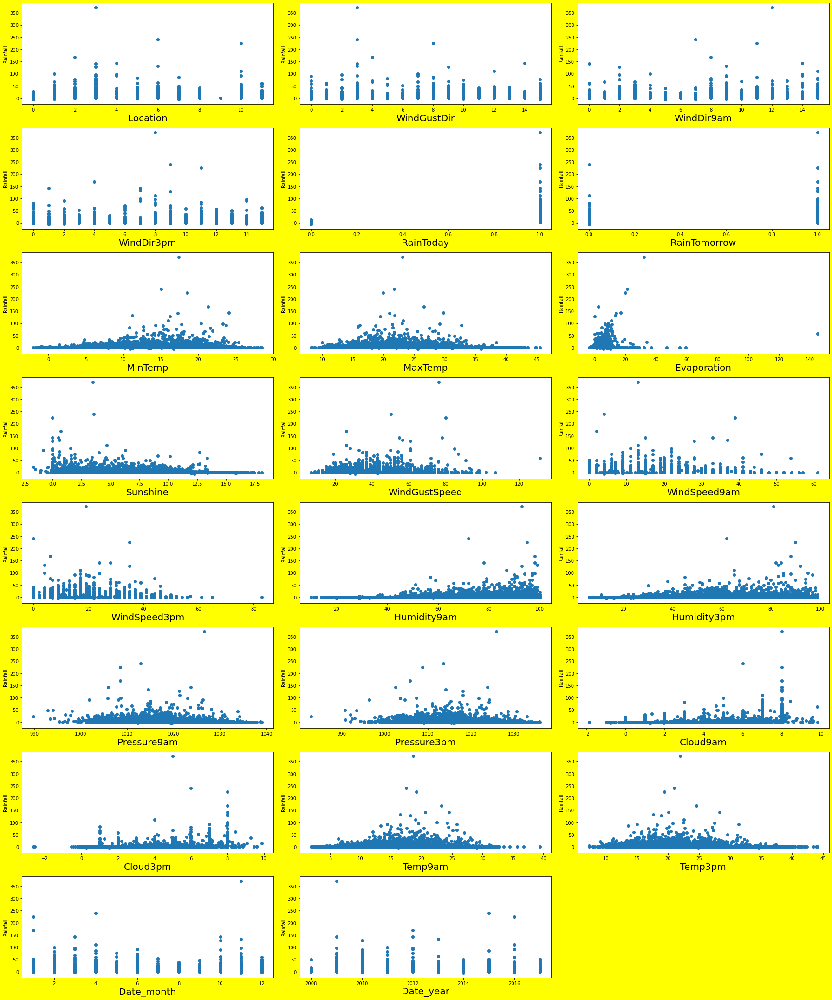

In [45]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'yellow')
plotnumber = 1

for column in x1:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        plt.scatter(x1[column],y1)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Rainfall',fontsize = 10)
    plotnumber +=1
plt.tight_layout()


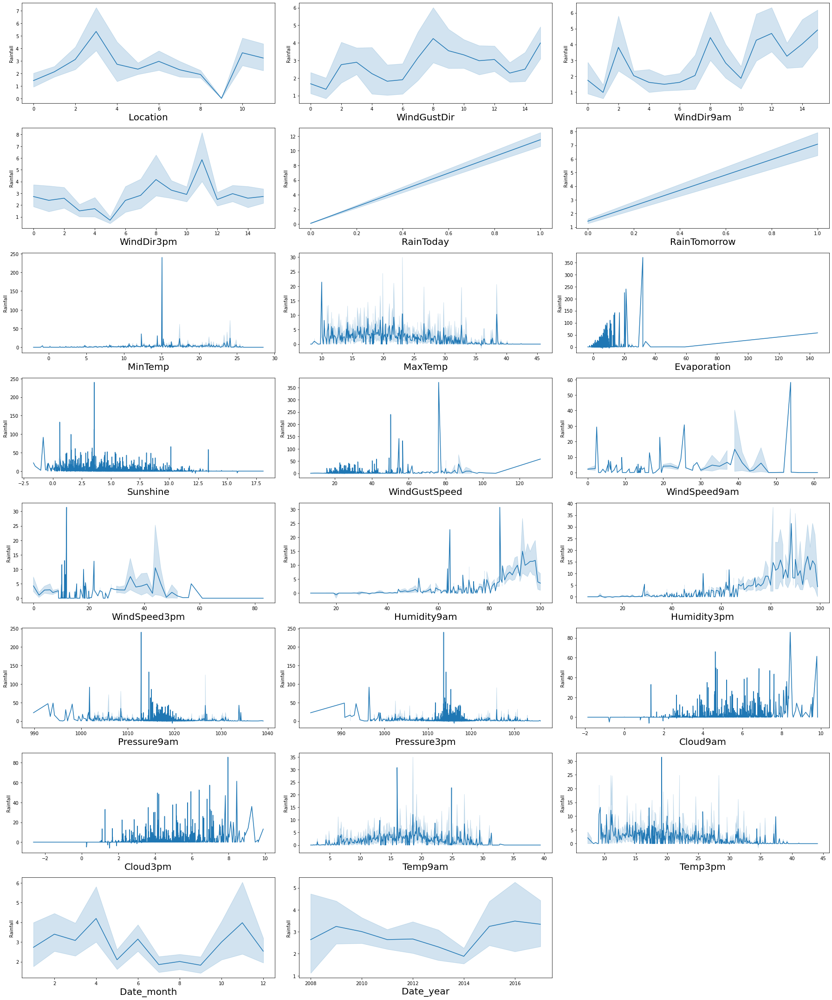

In [46]:
#Lets see how the data is distributed for every column as a whole

#Visualizing Relationship

plt.figure(figsize =(25,30), facecolor = 'white')
plotnumber = 1

for column in x1:
    if plotnumber <=23:
        ax = plt.subplot(8,3,plotnumber)
        sns.lineplot(x1[column],y1)
        plt.xlabel(column,fontsize = 20)
        plt.ylabel('Rainfall',fontsize = 10)
    plotnumber +=1
plt.tight_layout()

# EDA

### Describing the Dataset

In [32]:
df.describe()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,Evaporation,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
count,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,...,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000,6631.000000
mean,5.310964,7.025486,7.006786,7.836827,0.234354,0.237521,2.773784,13.078053,24.082961,4.886778,...,67.464366,50.414958,1017.882957,1015.329539,4.180610,4.156948,17.887474,22.681271,6.436435,2012.038154
std,3.102006,4.797981,4.549322,4.491813,0.423626,0.425596,10.547762,5.569245,6.136224,3.893507,...,17.219228,18.576077,6.123041,6.038670,2.682835,2.525294,5.735696,5.985879,3.360694,2.298119
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.995908,-2.000000,8.200000,-3.614712,...,10.000000,6.000000,989.800000,982.900000,-1.866715,-2.630109,1.900000,7.300000,1.000000,2008.000000
25%,2.000000,3.000000,3.000000,4.000000,0.000000,0.000000,0.000000,9.000000,19.500000,2.600000,...,56.000000,38.000000,1014.200000,1011.500000,1.708160,2.000000,13.800000,18.300000,4.000000,2010.000000
50%,6.000000,7.000000,7.000000,8.000000,0.000000,0.000000,0.000000,13.100000,23.400000,4.400000,...,68.000000,50.000000,1018.100000,1015.500000,4.066529,4.000000,17.900000,22.100000,6.000000,2012.000000
75%,8.000000,12.000000,11.000000,12.000000,0.000000,0.000000,1.000000,17.400000,28.400000,6.606596,...,80.000000,62.439242,1021.500000,1018.800000,7.000000,7.000000,22.200000,26.800000,9.000000,2014.000000
max,11.000000,15.000000,15.000000,15.000000,1.000000,1.000000,371.000000,28.500000,45.500000,145.000000,...,100.000000,99.000000,1039.000000,1036.000000,9.833482,9.888378,39.400000,44.100000,12.000000,2017.000000


# Observations:-

- As we have mentioned in the previous notes with the df. describe , we see that there are outliers and extreme values in some of the coulmns which  need to be treated 

# Visualization of the Data Properties


<AxesSubplot:>

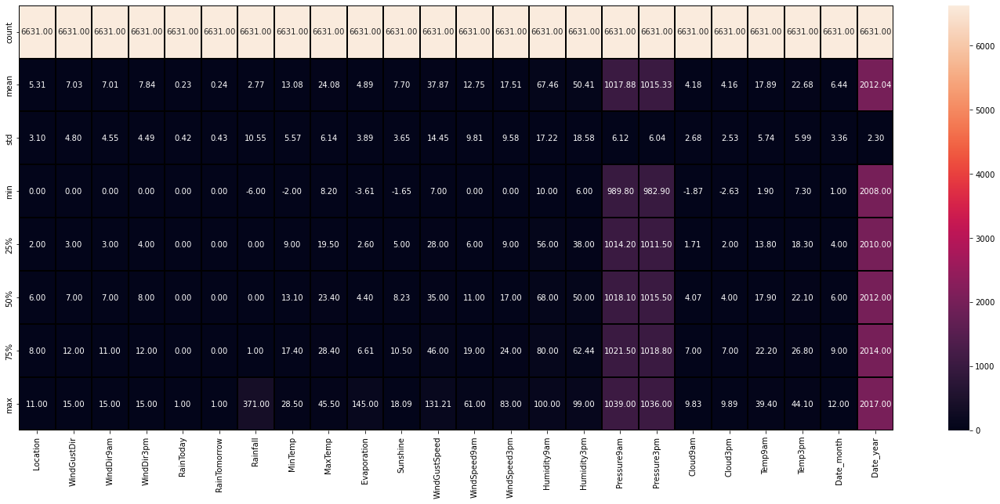

In [33]:
#Lets see how the data is distributed for every column

import matplotlib.pyplot as plt
plt.figure(figsize=(25,10))
sns.heatmap(df.describe(),annot=True,linewidths=0.1,linecolor="black",fmt='0.2f')

In [34]:
df.skew()

Location          0.001219
WindGustDir       0.180359
WindDir9am        0.218913
WindDir3pm       -0.119481
RainToday         1.254532
RainTomorrow      1.233839
Rainfall         13.632735
MinTemp          -0.072703
MaxTemp           0.334036
Evaporation       8.997849
Sunshine         -0.318492
WindGustSpeed     0.798030
WindSpeed9am      0.941780
WindSpeed3pm      0.560115
Humidity9am      -0.254062
Humidity3pm       0.153497
Pressure9am      -0.071825
Pressure3pm      -0.037099
Cloud9am         -0.062811
Cloud3pm          0.003583
Temp9am          -0.044236
Temp3pm           0.358552
Date_month        0.024616
Date_year         0.356749
dtype: float64

We see tat we have skewness of more than 0.55 in columns like Evaporation,windgustdir and winddir9pm , etc , which needs to be treated using the zscore , and rainfall is one of the labels so we will only treat it with the ascore as if we manipulate it the results for the model for the regression will be unfair

# Correlation of the columns with the  target variables 

In [48]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.457119
Temp3pm         -0.205217
Pressure9am     -0.175907
MaxTemp         -0.162427
Pressure3pm     -0.143215
Evaporation     -0.073970
Temp9am         -0.024757
Date_year       -0.011889
Location        -0.000430
Date_month       0.000276
WindDir3pm       0.005207
WindDir9am       0.042091
WindSpeed3pm     0.046231
WindGustDir      0.048887
WindSpeed9am     0.059988
MinTemp          0.102659
WindGustSpeed    0.170884
Rainfall         0.228004
Humidity9am      0.295093
RainToday        0.323666
Cloud9am         0.355076
Cloud3pm         0.415687
Humidity3pm      0.477250
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

In [49]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.240550
Temp3pm         -0.092691
MaxTemp         -0.088808
Pressure9am     -0.087503
Pressure3pm     -0.039370
Date_month      -0.011861
Date_year       -0.007664
Temp9am         -0.004565
Location        -0.003219
WindSpeed3pm     0.024640
WindDir3pm       0.032184
WindGustDir      0.036163
WindSpeed9am     0.056327
WindDir9am       0.092373
MinTemp          0.093940
WindGustSpeed    0.113168
Evaporation      0.118329
Cloud3pm         0.187496
Cloud9am         0.219341
RainTomorrow     0.228004
Humidity9am      0.230387
Humidity3pm      0.246746
RainToday        0.458153
Rainfall         1.000000
Name: Rainfall, dtype: float64

### We see that there are similarities between the variables correlation we see that the variables sunshine, all temp columns, date columns , pressure columns have negative relationship . the columns raintoday humidity,cloud,evaporation,wind columns all have positive relationship with the targets


## Heatmap of Correlation of the columns within the Columns or Features and Target

<AxesSubplot:>

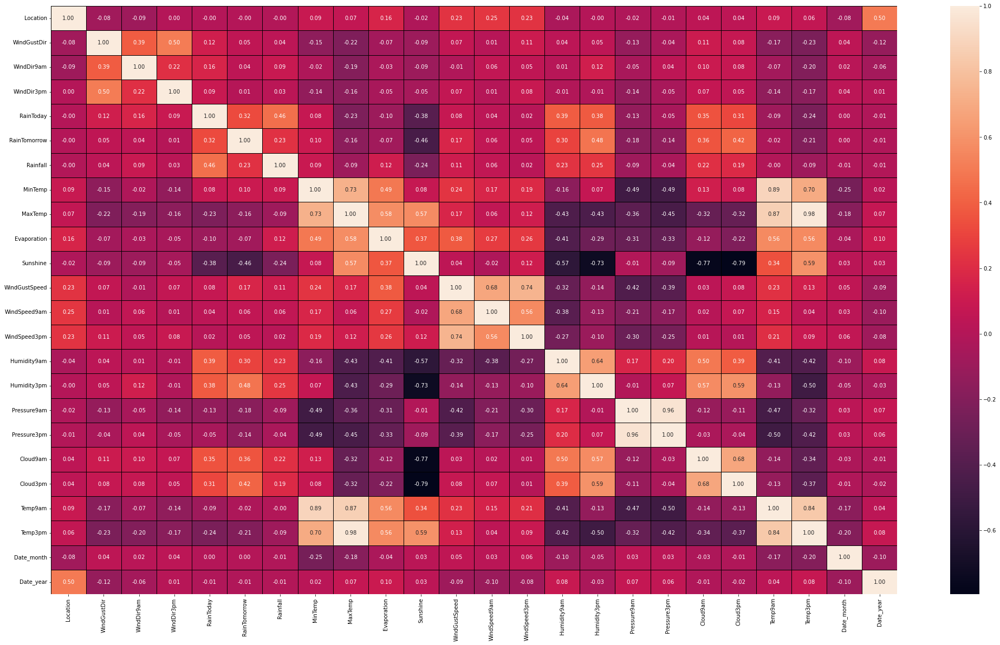

In [294]:
import seaborn as sns
import matplotlib.pyplot as plt
#size of canvas
plt.figure(figsize=(35,20))
sns.heatmap(df.corr(),annot=True, linewidths=0.5,linecolor='black', fmt='.2f')

### Observations from the heatmap

- we see that there there is high multicollinearity between Maxtemp and Temp3pm, thats the highest @ 98%, then Mintemp and Temp 9am is 2nd @ 89%,3rd is maxtemp and temp9am @87%, but these columns impact on the target is very less so we may remove them later after PCA analysis


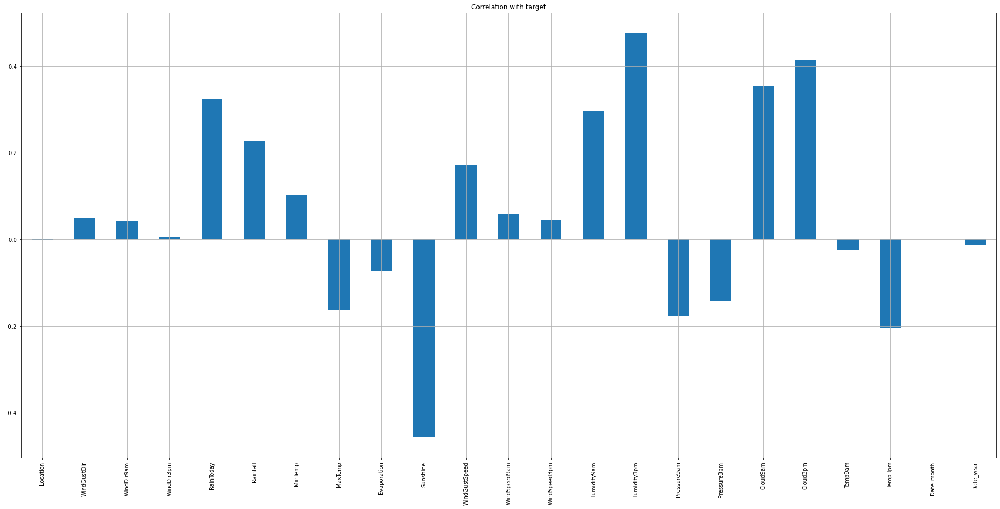

In [52]:
# Plotting a barplot to see th relationship with 1st label in a better way

df.drop('RainTomorrow', axis=1).corrwith(df.RainTomorrow).plot(kind='bar', grid=True,figsize=(32,15),
                                                  title='Correlation with target')

plt.show()

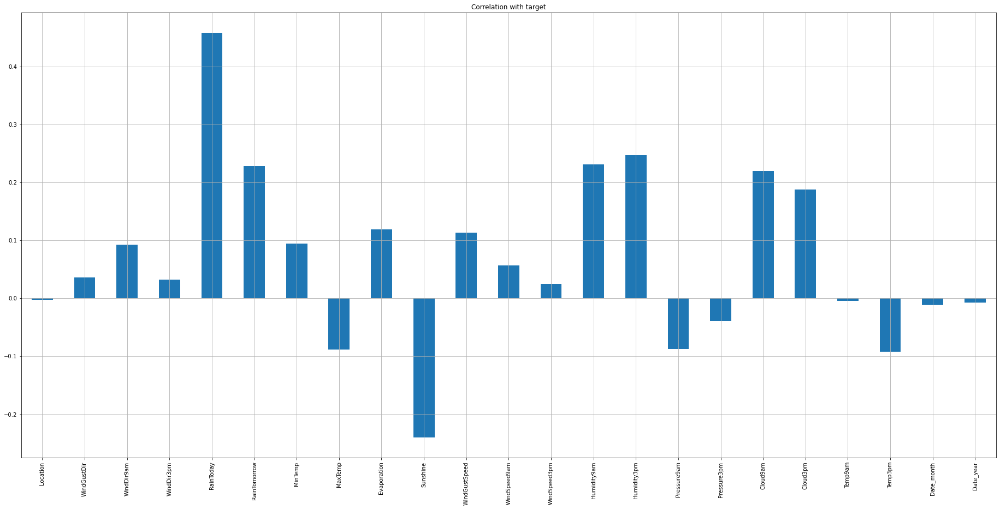

In [53]:
# Plotting a barplot to see th relationship with 1st label in a better way

df.drop('Rainfall', axis=1).corrwith(df.Rainfall).plot(kind='bar', grid=True,figsize=(32,15),
                                                  title='Correlation with target')

plt.show()

We see the values we have seen in the corr table represented graphically .
- For RainTomorrow we see that humidity and cloud columns are most impactful
- For Rain fall we see that raintoday and tommorrow the highest and humidity and cloud trailing behind

# Using SelectKBest Feature Selection Method - Target - Raintomorrow

Select KBest use f_classif function to find the best features, where f_classif uses Anova Test

In [54]:
# Again we Divide data into features and label

X = df.drop(columns = ['RainTomorrow'])
y = df['RainTomorrow']

In [55]:
from sklearn.feature_selection import SelectKBest, f_classif

In [56]:
best_features = SelectKBest(score_func = f_classif, k=23)

fit = best_features.fit(X,y)

df_scores = pd.DataFrame(fit.scores_)

df_columns = pd.DataFrame(X.columns)


#concatenate dataframes

feature_scores = pd.concat([df_columns, df_scores], axis = 1)

feature_scores.columns = ['Feature_name', 'Score']   #name output columns

print(feature_scores.nlargest(23,'Score'))  #Print Best features

     Feature_name        Score
14    Humidity3pm  1955.204510
9        Sunshine  1751.086671
18       Cloud3pm  1384.736480
17       Cloud9am   956.355634
4       RainToday   775.714312
13    Humidity9am   632.314098
5        Rainfall   363.510035
20        Temp3pm   291.447786
15    Pressure9am   211.672431
10  WindGustSpeed   199.397414
7         MaxTemp   179.628505
16    Pressure3pm   138.811820
6         MinTemp    70.606940
8     Evaporation    36.470048
11   WindSpeed9am    23.941221
1     WindGustDir    15.881045
12   WindSpeed3pm    14.198726
2      WindDir9am    11.764977
19        Temp9am     4.065535
22      Date_year     0.937065
3      WindDir3pm     0.179742
0        Location     0.001228
21     Date_month     0.000504


### We see that the feature Humidity3pm is the best  as the score they have are greater than 1955 approx which is really high, Even Sunshine is really high, the rest of them have a good impact or influence on the Raintomorrow label, but we are only performing this step as a way to analyze the data even further , We see that correlation showed different features and Kbest is showing different so we will move on and we will do some more analysis

# Using SelectKBest Feature Selection Method - Target - Rainfall

Select KBest use f_classif function to find the best features, where f_classif uses Anova Test

In [57]:
# Again we Divide data into features and label

X1 = df.drop(columns = ['Rainfall'])
y1 = df['Rainfall']

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif

In [58]:
best_features = SelectKBest(score_func = f_classif, k=23)

fit = best_features.fit(X1,y1)

df_scores = pd.DataFrame(fit.scores_)

df_columns = pd.DataFrame(X1.columns)


#concatenate dataframes

feature_scores = pd.concat([df_columns, df_scores], axis = 1)

feature_scores.columns = ['Feature_name', 'Score']   #name output columns

print(feature_scores.nlargest(23,'Score'))  #Print Best 4 features

     Feature_name     Score
4       RainToday       inf
8     Evaporation  7.960111
9        Sunshine  6.321553
13    Humidity9am  6.214924
14    Humidity3pm  5.964581
5    RainTomorrow  5.101735
17       Cloud9am  4.814709
18       Cloud3pm  3.977957
20        Temp3pm  2.587347
7         MaxTemp  2.454818
15    Pressure9am  1.827484
10  WindGustSpeed  1.717458
2      WindDir9am  1.611581
16    Pressure3pm  1.435605
1     WindGustDir  1.432694
12   WindSpeed3pm  1.419558
22      Date_year  1.289308
19        Temp9am  1.276970
11   WindSpeed9am  1.192410
3      WindDir3pm  1.156107
21     Date_month  1.082897
6         MinTemp  1.014865
0        Location  1.000570


## We see that the best is Raintoday just as we saw in the correlation , followed by evaporation and sunshine , but overall this label does not show strong relationship with the columns or features 

# Variance Inflation Factor

Checking for Multicollinearity problem to see if one feature is dependent on the other , we need to scale the dat first using MINMAX Scalar

In [59]:
from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()

In [70]:
X_scaled = mms.fit_transform(X)

In [61]:
X_scaled.shape

(6631, 23)

In [71]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]
vif["Features"] = X.columns

#chck Values
vif

,vif,Features
0,6.296290,Location
1,5.021580,WindGustDir
2,4.469950,WindDir9am
3,5.901015,WindDir3pm
4,2.106912,RainToday
5,2.345842,Rainfall
6,82.838195,MinTemp
7,287.714223,MaxTemp
8,11.822154,Evaporation
9,38.551853,Sunshine


We see a high variance in the columns Mintemp,maxtemp,sunshine, windgustspeed, windspeed,humidity pressure and temp 9am & 3pm as well, which needs to be treated

In [68]:
X_scaled1 = mms.fit_transform(X1)

In [69]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(X_scaled1, i) for i in range(X_scaled1.shape[1])]
vif["Features"] = X1.columns

#chck Values
vif

,vif,Features
0,6.317695,Location
1,5.018708,WindGustDir
2,4.465201,WindDir9am
3,5.903103,WindDir3pm
4,1.873941,RainToday
5,2.018140,RainTomorrow
6,82.734072,MinTemp
7,287.219470,MaxTemp
8,11.274896,Evaporation
9,38.847492,Sunshine


Same as the earlier observation we see many columns with high vif score which need to be treated of outliers

# Principal Component Analysis (PCA)

It is a dimension reduction technique and not a feature selection one.

and we are going to apply on the features only , it is mainly used if there are too many features and no correlation with the target

but its the final analysis we are going to do to chcek for multicollinearity problem

In [65]:
from sklearn.decomposition import PCA

In [66]:
pca = PCA()

In [72]:
pca.fit_transform(X_scaled) #To scale the data with PCA so we can plot the graph to see whats the coverage 

array([[ 2.22248546e-01, -8.59974627e-01, -1.56482586e-01, ...,
         2.28266539e-02, -9.76017671e-04,  1.02437239e-02],
       [-2.33742273e-01, -9.59129020e-01, -1.19786361e-01, ...,
        -1.45985922e-02,  5.99257778e-03, -8.52468103e-03],
       [-9.10934702e-02, -1.11215827e+00,  9.39399754e-02, ...,
         3.14356024e-02,  1.86240810e-03, -1.79620019e-02],
       ...,
       [-5.34327456e-01,  4.22710498e-03,  6.45132631e-02, ...,
         6.44004576e-03, -8.23179610e-03, -7.46520865e-03],
       [-4.56425337e-01, -1.86631379e-01,  2.70431105e-01, ...,
        -1.22990794e-02, -3.91913977e-03, -1.13213538e-02],
       [-4.10483685e-01, -5.25846362e-02,  2.13862401e-01, ...,
         1.07661069e-02, -6.47956743e-03, -1.80407855e-02]])

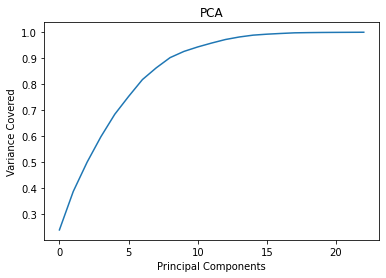

In [73]:
# lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

### We see that in order to cover 95% - 100% of the data we need to have only have 11 features and we can remove the rest , We will use the Kbest to decide which features are the best and see if we should remove any feautes , But at this pont we will move ahead as all the columns constitute to making the model better "


In [74]:
pca.fit_transform(X_scaled1) #To scale the data with PCA so we can plot the graph to see whats the coverage 

array([[-0.02440012, -0.85792671, -0.27119703, ...,  0.02284145,
        -0.00238773,  0.01008246],
       [-0.43446587, -0.81748279, -0.25499176, ..., -0.01413545,
         0.00945611, -0.00823591],
       [-0.32567331, -0.98647175, -0.08694549, ...,  0.03172217,
         0.00334617, -0.01794995],
       ...,
       [-0.60798264,  0.05668783,  0.10996813, ...,  0.00654293,
        -0.00503577, -0.00835388],
       [-0.5617251 , -0.12953857,  0.26711005, ..., -0.01250943,
        -0.00240198, -0.01153596],
       [-0.49870395, -0.01524634,  0.22359729, ...,  0.0106959 ,
        -0.00404252, -0.01860376]])

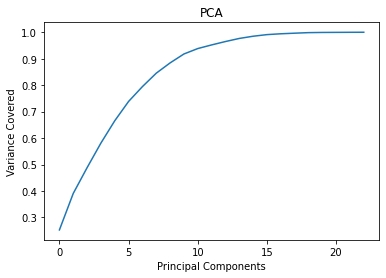

In [75]:
# lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

### Same as the other screeplotWe see that in order to cover 95% - 100% of the data we need to have only have 11 features and we can remove the rest , We will use the Kbest to decide which features are the best and see if we should remove any feautes , But at this pont we will move ahead as all the columns constitute to making the model better "


# Using Zscore to deal with the outliers in the data-1st label-raintomorrow

In [76]:
df.shape

(6631, 24)

In [77]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([  12,   12,   43,   43,   51,   51,   59,   59,   60,   60,   61,
          61,   61,   66,   67,   67,  122,  266,  270,  294,  379,  379,
         403,  404,  405,  429,  455,  458,  458,  555,  559,  560,  560,
         561,  594,  674,  674,  690,  704,  739,  739,  761,  787,  788,
         793,  925,  939,  969,  970,  970,  970,  998,  999, 1001, 1128,
        1138, 1139, 1139, 1141, 1179, 1193, 1227, 1231, 1254, 1255, 1347,
        1401, 1402, 1469, 1470, 1471, 1503, 1525, 1577, 1634, 1651, 1655,
        1663, 1670, 1764, 1802, 1856, 1881, 1881, 1886, 1928, 1999, 2011,
        2026, 2056, 2090, 2098, 2164, 2177, 2177, 2195, 2195, 2195, 2206,
        2207, 2241, 2405, 2463, 2475, 2501, 2501, 2515, 2567, 2650, 2651,
        2708, 2798, 2806, 2815, 2815, 2821, 2825, 2829, 2835, 2843, 2849,
        2856, 2857, 2863, 2864, 2866, 2866, 2867, 2871, 2875, 2877, 2885,
        2891, 2899, 2905, 2913, 2919, 2927, 2933, 2938, 2952, 2966, 2988,
        3012, 3012, 3019, 3020, 3020, 

In [78]:
df_new_z=df[(z<3).all(axis=1)]
df_new_z

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Rainfall,MinTemp,MaxTemp,Evaporation,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0,0.6,13.4,22.9,5.146735,...,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8,12,2008
1,1,14,6,15,0,0,0.0,7.4,25.1,5.824202,...,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3,12,2008
2,1,15,13,15,0,0,0.0,12.9,25.7,7.243981,...,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0,0.0,9.2,28.0,5.406861,...,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5,12,2008
4,1,13,1,7,0,0,1.0,17.5,32.3,5.333187,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,0,2,0,0,0,0.0,3.5,21.8,3.431302,...,59.0,27.0,1024.7,1021.2,1.697899,2.106836,9.4,20.9,6,2017
8420,9,0,9,1,0,0,0.0,2.8,23.4,4.079790,...,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4,6,2017
8421,9,6,9,3,0,0,0.0,3.6,25.3,3.812303,...,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5,6,2017
8422,9,3,9,14,0,0,0.0,5.4,26.9,5.611019,...,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1,6,2017


In [79]:
df_new_z.shape

(6319, 24)

In [80]:
#Percentage of Data loss

Data_loss = ((6631-6319)/6631)*100

In [81]:
Data_loss

4.7051726738048565

We have lost 4.70% of the data as we have to remove the skewness which occured due to outliers so that the model is not biased towards it

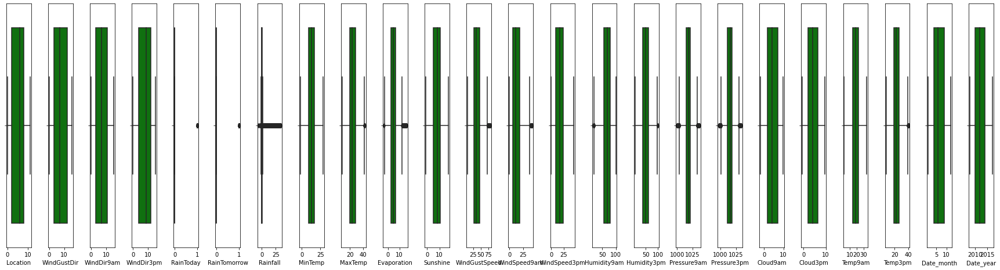

In [82]:
collist=df_new_z.columns.values
ncol=30
nrows=14
plt.figure(figsize=(ncol,3*ncol))
for i in range (0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df_new_z[collist[i]],color='green',orient='h')
    plt.tight_layout()

<AxesSubplot:>

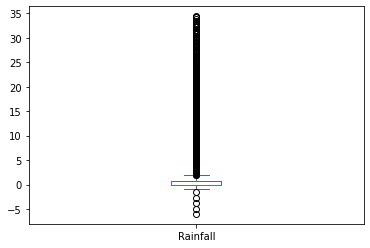

In [83]:
df_new_z['Rainfall'].plot.box()

After  treating with Zscore we see much better data , the only columns we see there is some outliers are the categorical columns which we cannot do anything for as we need all the data and we only treat continuos data for outliers

# Creating the Model for  Label-Raintomorrow - Choosing the Best Model

# Over Sampling using SMOTE

In [86]:
# Again we Divide data into features and label

X = df_new_z.drop(columns = ['RainTomorrow'])
y = df_new_z['RainTomorrow']

In [87]:
y.value_counts()

0    4871
1    1448
Name: RainTomorrow, dtype: int64

As we see the dataset is imbalanced and we need to treat this or the model will give a good score but will be biased

In [88]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.75,random_state = 322)

In [89]:
from collections import Counter
Counter(y_train)

Counter({0: 3657, 1: 1082})

In [90]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

In [91]:
sm = SMOTE()

ove_smp = SMOTE(0.75)

X_train_ns,y_train_ns= ove_smp.fit_resample(X_train,y_train) # using resample as the sample did not work

print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 3657, 1: 1082})
The number of classes after fit Counter({0: 3657, 1: 2742})


Here we see that the classes have become balanced and our model is ready to be trained

In [92]:
from sklearn.preprocessing import StandardScaler # scale the data as we have very high values in fnlwgt

scaler = StandardScaler()
X_train_ns = pd.DataFrame(scaler.fit_transform(X_train_ns), columns = X_train.columns)
X_test= pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
X_train_ns

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,Rainfall,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,0.912778,-0.010235,-0.914857,1.429590,-0.579576,-0.465723,-0.946371,-0.538526,-0.094654,0.543842,...,-0.109596,-0.277471,-0.052510,-0.275336,-0.969690,-0.242702,-0.355210,-0.532215,0.853336,0.468996
1,-0.086743,-0.872037,-0.462535,1.660162,1.725400,2.152562,0.736423,0.022906,0.488169,-1.908148,...,0.895859,1.641781,-1.383869,-1.302178,1.604917,1.796759,0.315944,-0.152017,1.472265,-0.872980
2,0.246431,-0.872037,-0.914857,0.276730,-0.579576,-0.465723,1.383651,2.064478,1.379538,0.081722,...,-0.109596,-0.796187,-0.464395,-0.642917,1.313589,0.964874,1.658252,2.008198,1.781729,0.916322
3,0.912778,-0.872037,-0.914857,-0.645559,-0.579576,-0.465723,-1.963444,-0.725670,-1.114595,0.816286,...,0.245271,-0.640572,1.745689,1.583601,-0.589144,-1.047753,-1.153339,-0.584060,0.543872,0.021671
4,1.912299,0.205215,1.120589,0.737874,-0.579576,-0.465723,-0.798433,-1.780483,-0.706829,0.022433,...,-0.523607,0.241246,-0.917029,-0.700236,-1.350237,-0.377990,-1.244036,-1.586399,0.234408,-1.320306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6394,-0.753090,-0.441136,1.346750,-1.106703,-0.579576,-0.318214,1.343751,0.656642,-0.094654,-0.678898,...,0.202518,1.204536,-1.117278,-1.122635,0.062332,0.735173,1.201910,0.235035,-1.622379,-1.320306
6395,0.246431,1.282466,1.346750,1.660162,-0.579576,-0.465723,-0.743893,-0.986681,-0.356863,-0.502248,...,-0.777903,1.148890,-0.426770,-0.023817,0.552496,1.105843,-0.625232,-1.278609,0.853336,-0.425655
6396,0.912778,1.282466,-0.914857,1.429590,-0.579576,-0.081111,-0.327933,-0.437950,-0.730045,-0.496947,...,1.037344,1.805938,-1.048130,-0.699786,0.552496,1.020913,-0.388039,-0.942164,0.543872,0.021671
6397,0.912778,1.282466,1.346750,1.429590,1.725400,4.216765,0.035238,-0.515188,-0.181960,-0.111823,...,0.205682,0.412297,-1.748110,-0.987158,0.920460,0.964874,-0.026158,-0.824861,0.234408,-0.425655


We have successfully balanced the data as well as scaled the data to start creating the model now

# Logistic Regression

In [93]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [94]:
scores=[]
for i in range(0,100):
    X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = i)
    lr.fit(X_train_ns,y_train_ns)
    pred_train = lr.predict(X_train_ns)
    pred_test=lr.predict(X_test)
    print(f"At random state {i},the training accuracy is :-{accuracy_score(y_train_ns,pred_train)}")
    print(f"At random state {i},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
    print('\n')
    scores.append(accuracy_score(y_test,pred_test))

At random state 0,the training accuracy is :-0.8430048533445874
At random state 0,the Testing accuracy is :-0.8417721518987342


At random state 1,the training accuracy is :-0.8427938383625238
At random state 1,the Testing accuracy is :-0.8417721518987342


At random state 2,the training accuracy is :-0.8440599282549061
At random state 2,the Testing accuracy is :-0.8462025316455696


At random state 3,the training accuracy is :-0.8444819582190336
At random state 3,the Testing accuracy is :-0.8379746835443038


At random state 4,the training accuracy is :-0.8413167334880777
At random state 4,the Testing accuracy is :-0.85


At random state 5,the training accuracy is :-0.847225152985862
At random state 5,the Testing accuracy is :-0.8316455696202532


At random state 6,the training accuracy is :-0.8411057185060139
At random state 6,the Testing accuracy is :-0.8525316455696202


At random state 7,the training accuracy is :-0.8411057185060139
At random state 7,the Testing accuracy is :-0.83

Finding the highest score using Argmax

In [95]:
np.argmax(scores)

8

In [96]:
scores[np.argmax(scores)]

0.8569620253164557

# We see that this model work well with the data , we see that the scores are the same at Training and testing state
    
    - we are getting 
     
     At random state 88,the training accuracy is :-0.8432158683266512

     At random state 88,the Testing accuracy is :-0.8424050632911393
     
- the training score and Testing score are equal  to each other here
- both the train and test score are really good but we will test more an also th cv score to see if its consistent  


# Train Test Split

In [100]:
X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 5 ) 

# as the best random state we have chosen is 5

### We are creating a method called Metric to allow us to show the metrics of each classification model we use , so we dont have to code it again 

In [101]:
#Write one function and call as many times to check accuracy_score of different models

def metric_score(clf,X_train_ns,X_test,y_train_ns,y_test,train=True):
    if train:
        y_pred = clf.predict(X_train_ns)
    
        
        print("\n===============================Train Result=============================")
        
        print(f"Accuracy score : {accuracy_score(y_train_ns,y_pred) * 100: .2f}%")
        
    elif train == False:
        pred = clf.predict(X_test)
        
        print("\n===============================Test Result===============================")
        print(f"Accuracy Scorre : {accuracy_score(y_test,pred) * 100: .2f}%")
        
        
        print ('\n \n Test Classification Report \n', classification_report(y_test, pred, digits = 2)) ##Model Confidence /Accurancy
        

In [102]:
#Call the function and pass dataset to check the train score and the test score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(lr,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  84.72%

===============================Test Result===============================
Accuracy Scorre :  83.35%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.94      0.90      1203
           1       0.72      0.49      0.58       377

    accuracy                           0.83      1580
   macro avg       0.79      0.71      0.74      1580
weighted avg       0.82      0.83      0.82      1580



### We see that this model is having a pretty good score in Logistic regression , we see the train score as 84.72% and the test score as 83.35% which is pretty good considering that this is actually a UPSIZED dataset and we have also done balancing of the label category due to imbalance 

Important to note we have used a different random state as the one we chose was having a higher train score as compared to this one so we changed

In [103]:
print(confusion_matrix(y_test,pred_test))  

[[994 209]
 [319  58]]


We see that the type 1 and 2 error is pretty high , and we need to see other models , but before that we will check cv score

# Cross-Validation of the model

In [104]:
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train_ns,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.8362096341175103 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold3 the cv score is 0.8262383201475118 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold4 the cv score is 0.8336804859669235 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold5 the cv score is 0.8320972017599246 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold6 the cv score is 0.8343052259349961 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold7 the cv score is 0.8308371665068853 and accuracy score for training is 0.6891749314201309and the accuracy for testing is 0.6658227848101266


At cross fold8 the cv score is 0.8357368323947956 and accuracy s

We see that the model is overfitting the data as we see the cv score of 83% approx is giving a test score of 66% approx so we need to check other models as this model is not working well and we have a underfitted test score

# Decision Tree Classifier

In [107]:
from sklearn.tree import DecisionTreeClassifier

dt=DecisionTreeClassifier()

X_train_ns,X_test,y_train_ns,y_test = train_test_split(X,y,test_size = 0.25,random_state = 5) #as we have seen a good score on 98th state
dt.fit(X_train_ns,y_train_ns)
pred_train = dt.predict(X_train_ns)
pred_test = dt.predict(X_test)
print(f"At random state {5},the training accuracy is :-{accuracy_score(y_train_ns,pred_train)}")
print(f"At random state {5},the Testing accuracy is :-{accuracy_score(y_test,pred_test)}")
print('\n')


At random state 5,the training accuracy is :-1.0
At random state 5,the Testing accuracy is :-0.7727848101265823




In [108]:
#Call the function and pass dataset to check the train score and the test score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(dt,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  77.28%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.84      0.85      1203
           1       0.52      0.54      0.53       377

    accuracy                           0.77      1580
   macro avg       0.69      0.69      0.69      1580
weighted avg       0.78      0.77      0.77      1580



In [182]:
print(confusion_matrix(y_test,pred_test)) 

[[24 14]
 [18 64]]


# Observations from the Decision Tree Classifier :-

    - We see that the training score is boosted all the way to 100% which is the highest  but the testing score is fallen shorter than logistic regression  @ 77.28 % which is lesser than the logistic model   , also we see that the F1 score is the same as test score for accuracy and precision is 69% , 86%for 0 and only 53% for 1 which is same than the last model 
    
    - the model is not performing as good as Logistic regression but we cant use this model moving to check the cv score

In [109]:
#Cross validation of the model
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(dt,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {accuracy_score(y_train_ns,pred_train)}and the accuracy for testing is {accuracy_score(y_test,pred_test)}")
    print('\n')

At cross fold2 the cv score is 0.7266992839426032 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold3 the cv score is 0.7238493975297224 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold4 the cv score is 0.7032857079869489 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold5 the cv score is 0.7178481764334466 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold6 the cv score is 0.7176691036062742 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold7 the cv score is 0.7246608022882229 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold8 the cv score is 0.6855649676725867 and accuracy score for training is 1.0and the accuracy for testing is 0.7727848101265823


At cross fold

We see a really good improvement with the Cv score compared to the last model , we see the cv score and test score is coming really close at 72% to 77% which is really good for the model

# KNN Classifier

In [111]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier()

knn.fit(X_train_ns,y_train_ns)
knn.score(X_train_ns,y_train_ns)
pred_decision =knn.predict(X_test)

knns = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',knns*100)

knnscore = cross_val_score(knn,X,y,cv=8)
knnc =knnscore.mean()
print('Cross Val Score :',knnc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 83.10126582278481
Cross Val Score : 81.80159150342526
[[1142   61]
 [ 206  171]]


In [112]:
#Call the function and pass dataset to check the train score and the test score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(knn,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  87.93%

===============================Test Result===============================
Accuracy Scorre :  83.10%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.95      0.90      1203
           1       0.74      0.45      0.56       377

    accuracy                           0.83      1580
   macro avg       0.79      0.70      0.73      1580
weighted avg       0.82      0.83      0.82      1580



# Observations from the KNN Classifier :-
    - We see that the training score is higher than Decision tree @ 83.10%   
    
    we see that the F1 score higher  where accuracy for 0 is 90% and for 1 is 56% which is bad and model is biased towards 0 
    
    - the CV score is good though and very similar to the test accuracy @ 81% highest among the 3 models we tested , so overall the model is ok , but we need to improve the f1 score and precision
    
    - we see the confusion matrix where the typ 1 and typ 2 error is much better than the previous models but error rate very high and we need to improve , lets test other models 

# Random Forest Classifier

In [118]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=4)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 83.22784810126582
Cross Val Score : 81.13683552320408
[[1137   66]
 [ 199  178]]


In [119]:
#Call the function and pass dataset to check the train score and the test score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(rf,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  100.00%

===============================Test Result===============================
Accuracy Scorre :  83.23%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.95      0.90      1203
           1       0.73      0.47      0.57       377

    accuracy                           0.83      1580
   macro avg       0.79      0.71      0.73      1580
weighted avg       0.82      0.83      0.82      1580



# Observations from the Random Forest Classifier :-
    - We see that like the decision tree the train score is at the max at 100% and we have test score much better at 83.23% , the F1 score is at 82% and precisiion @ 82% which is a good model and the best till now , we have imbalance dataset and we treated so we have a little higher Cv score of 81.13% approx so we are getting a good cv score as well which is on par with the test sore which is what we need the model to do 
    
    - the model has much lower errors in the confusion matrix as all the models but can be avoided

# XgBoost

In [123]:
import xgboost as xgb

xgb = xgb.XGBClassifier()

xgb.fit(X_train_ns,y_train_ns)
xgb.score(X_train_ns,y_train_ns)
pred_decision =xgb.predict(X_test)

xgbs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',xgbs*100)

xgbscore = cross_val_score(xgb,X,y,cv=9)
xgbc =xgbscore.mean()
print('Cross Val Score :',xgbc*100)
print(confusion_matrix(y_test,pred_decision)) 

Accuracy Score : 83.41772151898735
Cross Val Score : 77.17861811429061
[[1120   83]
 [ 179  198]]


In [124]:
#Call the function and pass dataset to check the train score and the test score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(xgb,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  99.98%

===============================Test Result===============================
Accuracy Scorre :  83.42%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.93      0.90      1203
           1       0.70      0.53      0.60       377

    accuracy                           0.83      1580
   macro avg       0.78      0.73      0.75      1580
weighted avg       0.82      0.83      0.83      1580



# Observations from the XGboost Classifier :-

    - We see that the training score is lower than the random forest and the decision tree at 99.98% and we see a higher accuracy score for test at 83.42 % which is  higher than the random forest ,we see the F1 score is same too @ 83% again  to rf  the precision score is 82% which is more than the Random forest 
    The CV score is exact same as the accuracy score @ 77% which is lower than the random forest whcih had a closer cv to the test score @ 81% approx so overall really good scores from this model, but the random forest shows the best as the cv score is closer to the test score , need to do more analysis

# SVC

In [126]:
from sklearn.svm import SVC

svc= SVC()

svc.fit(X_train_ns,y_train_ns)
svc.score(X_train_ns,y_train_ns)
pred_decision =svc.predict(X_test)

svcs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',svcs*100)

svcscore = cross_val_score(svc,X,y,cv=8)
svcc =svcscore.mean()
print('Cross Val Score :',svcc*100)
print(confusion_matrix(y_test,pred_decision))

Accuracy Score : 76.1392405063291
Cross Val Score : 77.0849777799169
[[1203    0]
 [ 377    0]]


In [127]:
#Call the function and pass dataset to check the train score and the test score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=True) #This is for the Training Score

metric_score(svc,X_train_ns,X_test,y_train_ns,y_test,train=False) #This is for the Testing Score


===============================Train Result=============================
Accuracy score :  77.40%

===============================Test Result===============================
Accuracy Scorre :  76.14%

 
 Test Classification Report 
               precision    recall  f1-score   support

           0       0.76      1.00      0.86      1203
           1       0.00      0.00      0.00       377

    accuracy                           0.76      1580
   macro avg       0.38      0.50      0.43      1580
weighted avg       0.58      0.76      0.66      1580



# Observations from the SVC Classifier :-
    - We see that this model is  performimg worser than all the other models we tested where the train score is 77% and the test is 76.14% F1 score is less and precioson is 38% which is less , the cv score is also on the lower side , 
    
    the confusionmatrix is giving lowest error and we dont see any predictions for 0 classes in label , so this model is not at all doing well for the dataset

## we can assume that Random Forest Classifier is the best algorithm for this project as it has the highest scores and least difference between the Cross val score and accuracy but we need to check roc auc to finalize the decision

# Let's check ROC AUC Curve for the fitted Model

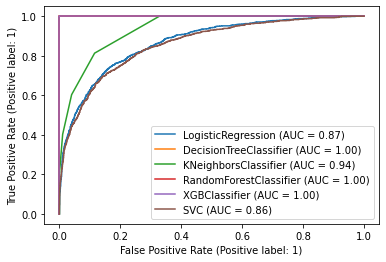

In [128]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt


### How well our model works on training Data

disp = plot_roc_curve(lr,X_train_ns,y_train_ns)

plot_roc_curve(dt,X_train_ns,y_train_ns, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(rf,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(xgb,X_train_ns,y_train_ns, ax= disp.ax_)

plot_roc_curve(svc,X_train_ns,y_train_ns, ax= disp.ax_)

plt.legend(prop={'size' : 10}, loc='lower right' )

plt.show()

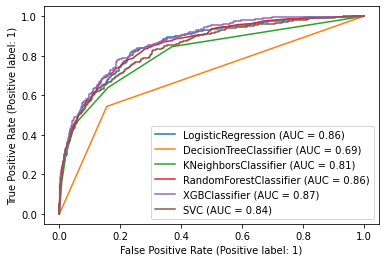

In [129]:
### How well our model works on Testing Data

disp = plot_roc_curve(lr,X_test,y_test)

plot_roc_curve(dt,X_test,y_test, ax= disp.ax_) #ax_ = Axes with confusion matrix

plot_roc_curve(knn,X_test,y_test, ax= disp.ax_)

plot_roc_curve(rf,X_test,y_test, ax= disp.ax_)

plot_roc_curve(xgb,X_test,y_test, ax= disp.ax_)

plot_roc_curve(svc,X_test,y_test, ax= disp.ax_)

plt.legend(prop={'size' : 10}, loc='lower right' )

plt.show()

# WE have again proved that we will use the Random Forest Classifier as the best  model

- The Logistic Regression is only covering 86% of training data and only 86% of the test data, same as  Random forest classifier is covering 100% of training data as well as 86% of test data which is the highest, the actual winner will be logistic regression but the cv score of random forest is better @ 81% . XGBoost may have 100% at train buts its only able to give 87% to test highest among all but the cv score is lower again so we will go with Random forest  
- closest to  XGboost classifier model is random forest Classifier but the scores a a little better with Random forest 
- Random forest  will be an even better model with Hyperparameter tuning which will increase 

# Hyper parameter Tuning

In [130]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
rf= RandomForestClassifier()

#Creating parameters to pass in RandomizedSearchCV

parameters = {'criterion':['gini','entropy'],
             'max_features':['auto','sqrt','log2'],
             'min_samples_split': [1, 2, 3, 4 ,5],
             'min_samples_leaf': [1, 3, 4, 5, 6,],
             'n_estimators' : [100,200,300,400,500]
             }

GCV = GridSearchCV(estimator = rf,param_grid=parameters, verbose=2,cv=3, n_jobs = -1, scoring='accuracy')
GCV.fit(X_train_ns,y_train_ns) #fitting data into the model
GCV.best_params_ #printing the best parameters found by the GridSearch CV

Fitting 3 folds for each of 750 candidates, totalling 2250 fits


{'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 200}

In [132]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier(n_estimators = 200 ,min_samples_split=4,min_samples_leaf=1,max_features='sqrt',criterion='entropy')

rf.fit(X_train_ns,y_train_ns)
rf.score(X_train_ns,y_train_ns)
pred_decision =rf.predict(X_test)

rfs = accuracy_score(y_test,pred_decision)
print('Accuracy Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=8)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)
print(confusion_matrix(y_test,pred_test)) 

Accuracy Score : 83.48101265822785
Cross Val Score : 81.89638783269962
[[1016  187]
 [ 172  205]]


We see that after tuning we are getting a higher score than we got before  , but we also see that the Cv score is come much closer to the  accuracy score @ 82% which is great as the closer the score the better the model. let save the rf model in pickle file  

In [133]:
GCV_pred=GCV.best_estimator_.predict(X_test) #predicting with the best parameters
accuracy_score(y_test,GCV_pred) #Checking Final Accuracy

0.8335443037974684

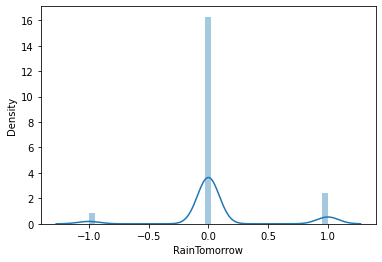

In [134]:
#Plotting distplot to show equillibrium 

sns.distplot(y_test-pred_decision)
plt.show()

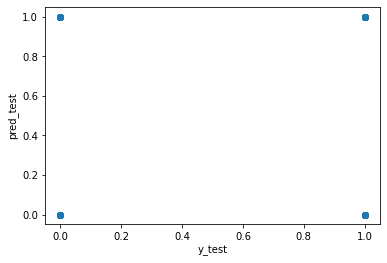

In [135]:
plt.scatter(y_test, pred_decision, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("pred_test")
plt.show()

We see that the model is accurate as the points in 0 are shown in 0 and 1 in 1 and the graph shows normal distribution as well 

In [136]:
import pickle
filename = 'raintomorrow.pkl'
pickle.dump(rf,open(filename,'wb'))

# Conclusion

In [137]:
loaded_model = pickle.load(open('raintomorrow.pkl','rb'))
result = loaded_model.score(X_test,y_test)
print(result*100)

83.48101265822785


In [138]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]],index=['Predicted','Orignal'])

In [139]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1570,1571,1572,1573,1574,1575,1576,1577,1578,1579
Predicted,0,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,1,1,0
Orignal,0,0,0,0,0,1,0,0,0,0,...,0,1,1,0,0,0,0,1,1,0


# We have 1580 columns where the model has predicted and Actuals and the model we have chosen is Random Forest Classifier as the ideal model for this project

# Creating the Model for 2nd Label-Rainfall - Choosing the Best Model

# PCA treatment

In [199]:
#Splitting the features and target for rainfall
X=df_new_z.drop(columns=['Rainfall'])
y=df_new_z['Rainfall']

In [201]:
scaler = StandardScaler()
X_scaled =scaler.fit_transform(X)

In [202]:
pca = PCA()
pca.fit_transform(X_scaled)

array([[ 4.07594166e-01,  1.51077575e+00,  2.59864173e+00, ...,
         3.64375647e-01,  2.71870300e-02,  1.39702245e-01],
       [ 1.84859955e+00, -1.34100588e+00,  2.57314916e+00, ...,
         9.39332252e-02, -3.16168283e-02, -1.07332960e-01],
       [ 2.55411004e+00,  1.95166579e-02,  3.44688787e+00, ...,
         1.94180504e-01,  2.75275736e-01,  3.10193020e-02],
       ...,
       [ 3.79528235e-01, -3.68541460e+00, -5.14900936e-04, ...,
        -2.71276337e-01,  1.19874109e-01, -1.48698198e-02],
       [ 1.10496118e+00, -2.80831689e+00,  5.03132752e-01, ...,
        -3.19664740e-01,  4.56890640e-02, -1.02765021e-01],
       [ 1.12713147e+00, -2.21948119e+00, -1.76178204e-01, ...,
        -1.12083577e-01,  1.95515450e-01, -4.53225731e-02]])

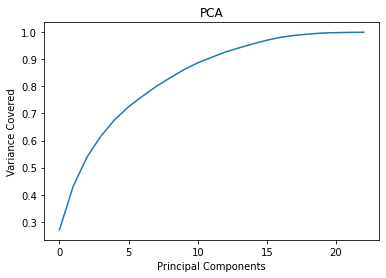

In [203]:
#lets plot scree plot to check the bset components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel("Variance Covered")
plt.title('PCA')
plt.show()

In [204]:
pca = PCA(n_components = 13)
new_pcomp = pca.fit_transform(X_scaled)
princ1_comp = pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13'])
princ1_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,0.407594,1.510776,2.598642,-2.770567,-0.731005,-0.612131,-0.024481,-1.609052,0.009341,-1.081513,-0.053017,0.650516,-0.645541
1,1.848600,-1.341006,2.573149,-3.125313,-0.625281,-1.867676,-0.059758,-0.404485,-0.780329,0.184854,0.294972,0.087189,0.055590
2,2.554110,0.019517,3.446888,-3.158385,-0.460575,-0.419989,0.585471,-0.766845,0.068234,-0.000720,0.058182,-0.351106,0.042666
3,2.004188,-2.954494,0.107496,-1.721660,-2.463269,-0.330028,1.270783,-0.062778,0.944787,-0.257572,-0.592171,0.596198,0.565142
4,1.152142,1.560247,-0.304991,-2.197198,-1.674319,-1.382770,-0.479347,-1.790398,-1.488342,-0.962703,0.743603,1.708878,0.301405
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6314,-0.312519,-3.340510,-0.305396,3.194032,0.077142,-1.007897,0.015309,0.547133,1.004739,-0.152618,-0.762275,0.812060,-0.193997
6315,0.207989,-3.644188,0.027855,2.496515,0.633224,-0.479869,0.689841,0.624857,1.847574,0.012686,-0.949484,0.640708,-0.476081
6316,0.379528,-3.685415,-0.000515,1.581952,1.492740,-0.556882,0.642053,0.533982,1.505052,0.132833,-0.749531,0.970064,0.186960
6317,1.104961,-2.808317,0.503133,1.082526,2.342491,-1.098030,0.316614,0.127148,0.446970,0.399501,-1.154085,-0.350945,-0.967695


In [205]:
#Data split into train and test

X_train,X_test,y_train,y_test = train_test_split(princ1_comp ,y,test_size = 0.25,random_state = 355)

## See that we are getting the same score even after incorporating the PCA so we are going to use all the features , seen that with PCS r2 score is 49.94% and without its 50.06%

In [212]:
df_new_z.skew()

Location         0.003705
WindGustDir      0.173799
WindDir9am       0.210571
WindDir3pm      -0.123815
RainToday        1.317174
RainTomorrow     1.289189
Rainfall         3.496464
MinTemp         -0.067478
MaxTemp          0.273488
Evaporation      0.545576
Sunshine        -0.353928
WindGustSpeed    0.584594
WindSpeed9am     0.674624
WindSpeed3pm     0.358478
Humidity9am     -0.233757
Humidity3pm      0.160575
Pressure9am     -0.035048
Pressure3pm      0.010061
Cloud9am        -0.045258
Cloud3pm         0.024775
Temp9am         -0.068371
Temp3pm          0.301381
Date_month       0.033089
Date_year        0.355271
dtype: float64

See that the data is reduced skewness after the zscore treatment as well and the only ones having are categorical columns as well as the target itself which we cant treat so there is some issue with the data 

In [200]:
X

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,1,13,13,14,0,0,13.4,22.9,5.146735,6.567859,...,71.0,22.0,1007.7,1007.1,8.000000,5.182827,16.9,21.8,12,2008
1,1,14,6,15,0,0,7.4,25.1,5.824202,12.406433,...,44.0,25.0,1010.6,1007.8,1.047056,1.649611,17.2,24.3,12,2008
2,1,15,13,15,0,0,12.9,25.7,7.243981,11.820881,...,38.0,30.0,1007.6,1008.7,2.100946,2.000000,21.0,23.2,12,2008
3,1,4,9,0,0,0,9.2,28.0,5.406861,12.886565,...,45.0,16.0,1017.6,1012.8,0.452548,1.061087,18.1,26.5,12,2008
4,1,13,1,7,0,0,17.5,32.3,5.333187,6.369314,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,0,2,0,0,0,3.5,21.8,3.431302,10.748262,...,59.0,27.0,1024.7,1021.2,1.697899,2.106836,9.4,20.9,6,2017
8420,9,0,9,1,0,0,2.8,23.4,4.079790,11.912692,...,51.0,24.0,1024.6,1020.3,0.666422,1.503963,10.1,22.4,6,2017
8421,9,6,9,3,0,0,3.6,25.3,3.812303,12.548026,...,56.0,21.0,1023.5,1019.1,0.532110,1.076773,10.9,24.5,6,2017
8422,9,3,9,14,0,0,5.4,26.9,5.611019,12.315648,...,53.0,24.0,1021.0,1016.8,0.779473,1.508223,12.5,26.1,6,2017


In [142]:
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8419    0.0
8420    0.0
8421    0.0
8422    0.0
8423    0.0
Name: Rainfall, Length: 6319, dtype: float64

## Progressing to the normal steps as additional steps did not help increasing the score 

In [143]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.75,random_state = 322)

In [144]:
from sklearn.preprocessing import StandardScaler # scale the data as we have very high values in fnlwgt

scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
X_test= pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
X_train

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Date_month,Date_year
0,0.866303,-0.009350,-0.885061,1.368014,-0.535465,-0.543940,-0.863738,-0.598633,-0.153245,0.343098,...,0.036932,-0.063035,-0.131351,-0.331477,-0.790286,-0.042854,-0.347363,-0.614439,0.771359,0.424187
1,-0.100131,-0.841446,-0.444807,1.590302,1.867536,1.838437,0.775809,-0.050912,0.407516,-2.155214,...,1.034686,1.943993,-1.446022,-1.340264,1.735418,1.969576,0.304931,-0.241051,1.369391,-0.888826
2,0.222014,-0.841446,-0.885061,0.256576,-0.535465,1.838437,1.406403,1.940799,1.265144,-0.127753,...,0.036932,-0.605475,-0.538073,-0.692594,1.449624,1.148716,1.609518,1.880472,1.668407,0.861858
3,0.866303,-0.841446,-0.885061,-0.632575,-0.535465,-0.543940,-1.854673,-0.781206,-1.134577,0.620688,...,0.389081,-0.442743,1.644308,1.494775,-0.416968,-0.837234,-1.123063,-0.665355,0.472343,-0.013484
4,1.832737,0.198674,1.096085,0.701151,-0.535465,1.838437,-0.719602,-1.810257,-0.742246,-0.188162,...,-0.373908,0.479405,-0.985034,-0.748906,-1.163605,-0.176348,-1.211211,-1.649742,0.173327,-1.326497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4734,1.510592,1.446819,-0.004552,1.368014,-0.535465,1.838437,1.442437,2.870264,2.375388,0.607115,...,-1.430353,-1.093671,-1.548464,-1.496800,0.329669,1.545907,2.438107,2.627248,-1.620769,2.174872
4735,-1.388709,1.446819,-0.885061,1.368014,-0.535465,-0.543940,1.280284,1.426274,1.278958,1.165459,...,-0.667365,-1.907331,-2.180189,-2.383836,-0.289981,-0.778838,1.186409,1.591945,1.668407,-1.764168
4736,-1.388709,0.614722,0.435703,-1.744013,-0.535465,-0.543940,0.091163,1.276895,0.846955,1.430451,...,-0.726056,-1.147915,1.900413,1.633918,-1.165516,-1.095632,0.551745,1.286445,1.369391,-1.326497
4737,-0.100131,1.654843,1.536339,1.368014,1.867536,-0.543940,-0.899772,-1.212744,-0.854196,-0.239842,...,0.447772,-0.225767,0.005238,0.520774,0.329669,0.354336,-1.034915,-1.123604,-0.125689,-0.888826


# Linear Regression Model

In [145]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

In [206]:
scores_test=[]
for i in range(0,100):
    X_train,X_test,y_train,y_test = train_test_split(princ1_comp,y,test_size = 0.25,random_state = i)
    lr.fit(X_train,y_train)
    pred_train = lr.predict(X_train)
    pred_test = lr.predict(X_test)
    print(f"At random state {i},the training accuracy is :-{r2_score(y_train,pred_train)}")
    print(f"At random state {i},the testing accuracy is :-{r2_score(y_test,pred_test)}")
    print('\n')
    scores_test.append(r2_score(y_test,pred_test))

At random state 0,the training accuracy is :-0.5018547610024806
At random state 0,the testing accuracy is :-0.4748519159477115


At random state 1,the training accuracy is :-0.49835921360732915
At random state 1,the testing accuracy is :-0.48485775895828187


At random state 2,the training accuracy is :-0.4916592105496128
At random state 2,the testing accuracy is :-0.5010861410138626


At random state 3,the training accuracy is :-0.4949867628823419
At random state 3,the testing accuracy is :-0.49541697434380016


At random state 4,the training accuracy is :-0.49904729870696296
At random state 4,the testing accuracy is :-0.48369183608106747


At random state 5,the training accuracy is :-0.49370803948532616
At random state 5,the testing accuracy is :-0.5003836962853138


At random state 6,the training accuracy is :-0.49601577822138765
At random state 6,the testing accuracy is :-0.49258037054108594


At random state 7,the training accuracy is :-0.49367784142076354
At random state 7,the te

In [150]:
scores_test[np.argmax(scores_test)]

0.5314832169017611

# We have seen that the best random state for the observations is 30 but all are at 50% and which is very low for the model and is not good fit for the data 

At random state 30,the training accuracy is :-0.5014971732811984



At random state 30,the testing accuracy is :-0.5006375344803744


We have chosen this as the difference between the two scores is very very less almost in decimals and the rest are not higher than this 

### Splitting again train test split with ideal Random state

In [207]:
X_train,X_test,y_train,y_test = train_test_split(princ1_comp,y,test_size = 0.25,random_state = 30)

In [208]:
lr.fit(X_train,y_train)

LinearRegression()

In [209]:
pred_test=lr.predict(X_test)

In [210]:
print(r2_score(y_test,pred_test))

0.4948539276554731


# We observed that Linear Regression is doing very poorly with this data as we are getting 50.06% approx which is very less  50% itself means its not a good model


We will try other models cause we cant consider a model with  50% r2 score

# Cross-Validation of the model

In [155]:
Train_accuracy=r2_score(y_train,pred_train)
Test_accuracy=r2_score(y_test,pred_test)

from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,X,y,cv=j)
    cv_mean=cv_score.mean()
    print(f"At cross fold{j} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy}and the accuracy for testing is {Test_accuracy}")
    print('\n')

At cross fold2 the cv score is 0.4670066459701061 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold3 the cv score is 0.48349398310527875 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold4 the cv score is 0.48710647012403135 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold5 the cv score is 0.4892200653998426 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold6 the cv score is 0.488374420152401 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold7 the cv score is 0.49491396477955746 and accuracy score for training is -0.4943176246055776and the accuracy for testing is 0.5006375344803744


At cross fold8 the cv score is 0.4920704581611411 and ac

## we see that the cv scores are pretty close to the test score and we see that cv score @ 7 is the closes to the test score @ 49% , but overall we see that the model is not doing well for the dataset

# Plotting the linear Regression graph with actual and predicted values comparison

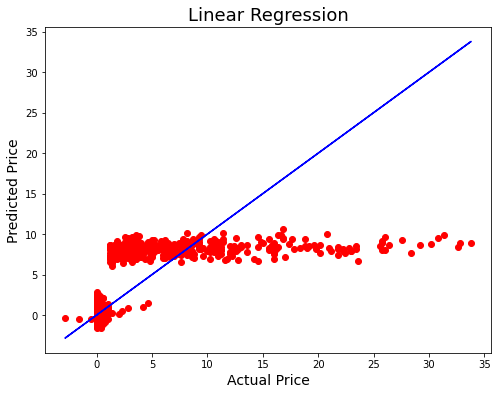

In [156]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual Price',fontsize=14)
plt.ylabel('Predicted Price',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

## We see that the model is doing exceptionally bad in predicting , here we see the actual and predicted are not on the same line which is really really bad and the data is not showing a trend as well

# Regularization of the Linear Model

In [157]:
from sklearn.model_selection import GridSearchCV #to select the pest parameters for hyperparameter tuning
from sklearn.model_selection import cross_val_score #to check the difference from the earlier score without hyper parameter tuning

In [158]:
from sklearn.linear_model import Lasso

parameters ={'alpha' : [.0001, .001, .01, .1, 1, 10],
            'random_state' : list(range(0,15))}
ls = Lasso()
clf = GridSearchCV(ls,parameters)
clf.fit(X_train, y_train)

print(clf.best_params_)

{'alpha': 0.01, 'random_state': 0}


# Final model training for Linear Regression

In [159]:
ls = Lasso(alpha= 0.01, random_state= 0)
ls.fit(X_train,y_train)
ls_score_training = ls.score(X_train,y_train)
pred_ls = ls.predict(X_test)
ls_score_training*100

50.139141393937514

We are getting a bad lasso score of 50.14% which is very high to the cross val score 49% approx for training we got earlier so we cant consider the model is doing very bad for this dataset


A reason for the  scores to be this bad is due to the nature of the label, as we see that the dataset is imbalanced initially where rain only fell 26% approx of the time , so the values in the label have huge outliers as there is an extreme range btw the days it doesnt rain and the dates it does as well as the other properties have such extreme values , even after treatment with zscore we see that the model is not able to get a normally distributed dataset to make a better prediction so we will have to try other models and see if this improves

# Checking MSE,RMSE score 

In [160]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 1.6729998890380346
MSE: 11.718940693970326
RMSE: 3.4232938369310815


We see that the values of the mae and mse are really good , very less error rates are seen 

# Decision Tree Regressor

In [172]:
from sklearn.tree import DecisionTreeRegressor

dt=DecisionTreeRegressor()
dt.fit(X_train,y_train)
dt.score(X_train,y_train)
pred_test =dt.predict(X_test)
dfs = r2_score(y_test,pred_test)
print('R2 Score :',dfs*100)

dfscore = cross_val_score(dt,X,y,cv=7)
dfc =dfscore.mean()
print('Cross Val Score :',dfc*100)


R2 Score : 10.873653152049567
Cross Val Score : 5.01480761549471


## We observe that for Decision tree regressor :-
- The model is  at R2 Score of 10.87 %approx which is way worse that linear regression
- we also see that the cross val score is also very bad compared to linear , and we cannot choose this model as well as the score is 5.01 % approx 
- there is very slight  difference between the r2 score and cross val score but the model has a horrible score of 10% which is not good
- we see that the score is much much better  than Linear regression model of 50% approx
- tryin the next model which is knn as we need to have a closer difference btw the cross val and R2 Score 


In [176]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.0816417635655204
MSE: 18.944845009984498
RMSE: 4.352567634165435


We see that the mse is a little on higher end but the rest of the scores are good here , but the r2 score is not moving on

# K- Nearest Neighbors

In [179]:
from sklearn.neighbors import KNeighborsRegressor

knn=KNeighborsRegressor()
knn.fit(X_train,y_train)
knn.score(X_train,y_train)
pred_test =knn.predict(X_test)
knns = r2_score(y_test,pred_test)
print('R2 Score :',knns*100)

knnscore = cross_val_score(knn,X,y,cv=8)
knnc =knnscore.mean()
print('Cross Val Score :',knnc*100)


R2 Score : 12.317747377634392
Cross Val Score : 9.932076392735375


# We observe that for K-nearest neighbors :-
- The model is not at all working well for the data set and we see that the score is a horrible  compared to linear regression model but higher than Decision tree @ 12.31% approx
- we also see that the cross val score is also very bad compared to linear  , and we cannot choose this modelsame as  the linear model but its better that Decision tree cv score @ 10 % approx 
- there is very less  difference between the r2 score and cross val score  
- tryin the next model which is Enseble techniques , and we will use Random Forest Regressor 


In [180]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.0816417635655204
MSE: 18.944845009984498
RMSE: 4.352567634165435


We see that the mse is a little on higher end but the rest of the scores are good here , but the r2 score is not moving on

# Random Forest Regressor

In [169]:
from sklearn.ensemble import RandomForestRegressor

rf=RandomForestRegressor()
rf.fit(X_train,y_train)
rf.score(X_train,y_train)
pred_decision =rf.predict(X_test)

rfs = r2_score(y_test,pred_decision)
print('R2 Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=7)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)


R2 Score : 52.27019124813952
Cross Val Score : 50.99797281926993


# We observe that for Random Forest Regressor :-

- The model is doing much better than the 3 models we test before , the R2 score is @ 53% approx which is much better than the rest and our cross val is still better @ 50.99% approx
- we also see that the cross val score is a little better compared to linear and tree,  we see the Difference between the R2 score and cv score is good as well
- we see that the score is higher than Linear regression model of 50% approx
- tryin the next model which is Ensemble techniques , and we will use Ada boosted Trees 



In [181]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.0816417635655204
MSE: 18.944845009984498
RMSE: 4.352567634165435


# ADA Boost Regressor

In [186]:
from sklearn.ensemble import AdaBoostRegressor
ada = AdaBoostRegressor()

ada.fit(X_train,y_train)
ada.score(X_train,y_train)
pred_decision =ada.predict(X_test)

adas = r2_score(y_test,pred_decision)
print('R2 Score :',adas*100)

adascore = cross_val_score(ada,X,y,cv=7)
adac =adascore.mean()
print('Cross Val Score :',adac*100)


R2 Score : 42.69097511851033
Cross Val Score : 41.270841086748916


In [187]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_decision))
print('MSE:', metrics.mean_squared_error(y_test, pred_decision))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_decision)))

MAE: 1.51352537135257
MSE: 12.38233007914567
RMSE: 3.5188535177164835


# We observe that for ADA Boost Regressor :-
- The model is not  working well for the data set and we see that the score is also very low compared to Random forest & Linear as well by a small margin
- we also see that the cross val score is a much much lower  compared to linear and random forest ,   we cannot choose this over the random forest  
- there is very lettlw  difference between the r2 score  and cross val score but the model is not doing well at all 
- we see that the score is lesser than Linear regression model of 43% approx
- tryin the next model which is Xgboost model 


# Xgboost Regressor

In [188]:
import xgboost as xgb
xgb = xgb.XGBRegressor()

xgb.fit(X_train,y_train)
xgb.score(X_train,y_train)
pred_decision =xgb.predict(X_test)

xgbs = r2_score(y_test,pred_decision)
print('R2 Score :',xgbs*100)

xgbscore = cross_val_score(xgb,X,y,cv=7)
xgbc =xgbscore.mean()
print('Cross Val Score :',xgbc*100)



R2 Score : 47.309583511246366
Cross Val Score : 45.094355501093695


In [189]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_decision))
print('MSE:', metrics.mean_squared_error(y_test, pred_decision))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_decision)))

MAE: 1.4102318715873419
MSE: 11.384422092690961
RMSE: 3.3740809256286313


# We observe that for Xtreme Gradient Boost Regressor :-

- The model is giving lesser score than linear regression and random forest @ 47.30%
- we also see that the cross val score is a much much closer  compared to linear and all the models ,  
- we see that the mae and mse score are low , which is good
   

# Hyper parameter Tuning with Random Forest Regressor  

In [190]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

#Creating parameters to pass in GridSearchCV

parameters = {'criterion':['mse','mae','rmse'],
             'max_features':['auto','sqrt','log2'],
             'max_features': [2, 3, 4 ,5,7],
             'min_samples_leaf': [3, 4, 5, 6, 7],
             'n_estimators' : [100,200,300,400,500]
             }
rf=RandomForestRegressor()
clf= GridSearchCV(rf,parameters,verbose=2,n_jobs=-1,cv=2)
clf.fit(X_train,y_train)

print(clf.best_params_)

Fitting 2 folds for each of 375 candidates, totalling 750 fits
{'criterion': 'mse', 'max_features': 7, 'min_samples_leaf': 5, 'n_estimators': 200}


In [191]:
from sklearn.ensemble import RandomForestRegressor

rf=RandomForestRegressor(criterion= 'mse', max_features= 7, min_samples_leaf= 5, n_estimators= 200)
rf.fit(X_train,y_train)
rf.score(X_train,y_train)
pred_decision =rf.predict(X_test)

rfs = r2_score(y_test,pred_decision)
print('R2 Score :',rfs*100)

rfscore = cross_val_score(rf,X,y,cv=7)
rfc =rfscore.mean()
print('Cross Val Score :',rfc*100)


R2 Score : 55.48149072888406
Cross Val Score : 52.4244674787427


### We see that we have increased  the score @ 55.50% now which is a good sign and this model is the best for this project and Cv score has increased as well but overall we need to work on more steps as the actual scores are not good for any model we need more to 70-80 for a decent model

In [192]:
#Checking MAE MSE and RMSE scores
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))

MAE: 2.0816417635655204
MSE: 18.944845009984498
RMSE: 4.352567634165435


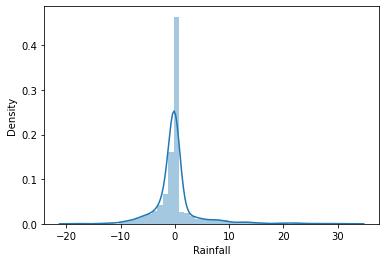

In [193]:
#Plotting distplot to show equillibrium 

sns.distplot(y_test-pred_test)
plt.show()

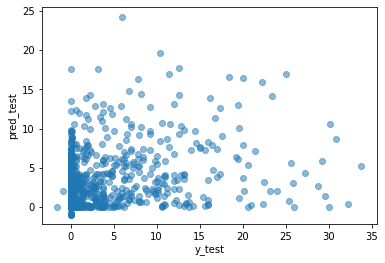

In [194]:
plt.scatter(y_test, pred_test, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("pred_test")
plt.show()

In [195]:
import pickle
filename = 'rainfall.pkl'
pickle.dump(rf,open(filename,'wb'))

# Conclusion

In [196]:
loaded_model = pickle.load(open('rainfall.pkl','rb'))
result = loaded_model.score(X_test,y_test)
print(result*100)

55.48149072888406


In [197]:
conclusion = pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]],index=['Predicted','Orignal'])

In [198]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,1570,1571,1572,1573,1574,1575,1576,1577,1578,1579
Predicted,0.388043,0.016602,0.017015,0.380758,0.359373,0.33097,0.255825,0.124248,0.005997,0.025115,...,5.314052,9.437881,0.426196,0.041935,6.229918,0.113417,1.438568,0.255616,0.058877,0.139981
Orignal,0.388043,0.016602,0.017015,0.380758,0.359373,0.33097,0.255825,0.124248,0.005997,0.025115,...,5.314052,9.437881,0.426196,0.041935,6.229918,0.113417,1.438568,0.255616,0.058877,0.139981


### We see that the model has predicted the charges on 1580 columns againest the actual charges , so the Random Forest is the best one of them all